In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_excel('C:\\Users\\Akshat\\Downloads\\matabolic\\Metabolic_Syndrome_1000_Patients_Pre_Post_6_Months.xlsx')

In [4]:
df.head()

,Patient ID,Gender,Age (years),Height (cm),Waist Circumference Pre (cm),Waist Circumference Post (cm),BMI Pre,BMI Post,Body Fat Pre (kg),Body Fat Post (kg),...,Systolic BP Post (mmHg),Diastolic BP Pre (mmHg),Diastolic BP Post (mmHg),Fasting Glucose Pre (mg/dL),Fasting Glucose Post (mg/dL),Fasting Insulin Pre (µIU/mL),Fasting Insulin Post (µIU/mL),HOMA-IR Pre,HOMA-IR Post,Metabolic Syndrome Status (Post)
0,1,Female,29,156,113,101,32.3,28.2,27.2,23.9,...,122,92,84,125,98,29.0,18.8,8.95,4.55,Remission
1,2,Female,35,156,104,98,32.7,28.2,40.8,35.5,...,127,88,80,139,108,24.8,13.3,8.51,3.55,Remission
2,3,Female,44,159,97,89,28.7,24.4,32.1,28.2,...,126,92,85,131,102,27.8,15.2,8.99,3.83,Remission
3,4,Female,24,157,107,94,35.7,30.7,32.6,27.0,...,124,93,83,127,96,20.0,13.7,6.27,3.25,Remission
4,5,Female,36,158,124,117,34.7,30.8,35.0,30.8,...,124,92,84,130,105,21.0,10.9,6.74,2.83,Remission


In [5]:
df.tail()

,Patient ID,Gender,Age (years),Height (cm),Waist Circumference Pre (cm),Waist Circumference Post (cm),BMI Pre,BMI Post,Body Fat Pre (kg),Body Fat Post (kg),...,Systolic BP Post (mmHg),Diastolic BP Pre (mmHg),Diastolic BP Post (mmHg),Fasting Glucose Pre (mg/dL),Fasting Glucose Post (mg/dL),Fasting Insulin Pre (µIU/mL),Fasting Insulin Post (µIU/mL),HOMA-IR Pre,HOMA-IR Post,Metabolic Syndrome Status (Post)
995,996,Male,21,161,140,124,29.2,25.5,34.5,30.0,...,123,95,87,132,112,20.3,11.2,6.62,3.10,Remission
996,997,Male,34,157,112,103,33.5,29.4,25.3,22.2,...,126,90,81,135,116,32.8,20.8,10.93,5.96,Remission
997,998,Male,43,158,140,129,34.6,30.5,41.6,37.3,...,121,92,85,122,103,27.4,14.3,8.25,3.64,Remission
998,999,Male,36,160,125,116,34.2,29.4,34.7,28.8,...,116,90,83,130,98,22.5,13.1,7.22,3.17,Remission
999,1000,Male,40,157,113,102,28.8,24.8,40.5,36.1,...,119,92,83,137,109,24.3,13.9,8.22,3.74,Remission


In [6]:
df.shape

(1000, 33)

In [7]:
df.columns

Index(['Patient ID', 'Gender', 'Age (years)', 'Height (cm)',
       'Waist Circumference Pre (cm)', 'Waist Circumference Post (cm)',
       'BMI Pre', 'BMI Post', 'Body Fat Pre (kg)', 'Body Fat Post (kg)',
       'Skeletal Muscle Pre (kg)', 'Skeletal Muscle Post (kg)',
       'Visceral Fat Pre (kg)', 'Visceral Fat Post (kg)',
       'Total Cholesterol Pre (mg/dL)', 'Total Cholesterol Post (mg/dL)',
       'Triglycerides Pre (mg/dL)', 'Triglycerides Post (mg/dL)',
       'LDL Pre (mg/dL)', 'LDL Post (mg/dL)', 'HDL Pre (mg/dL)',
       'HDL Post (mg/dL)', 'Systolic BP Pre (mmHg)', 'Systolic BP Post (mmHg)',
       'Diastolic BP Pre (mmHg)', 'Diastolic BP Post (mmHg)',
       'Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)',
       'Fasting Insulin Pre (µIU/mL)', 'Fasting Insulin Post (µIU/mL)',
       'HOMA-IR Pre', 'HOMA-IR Post', 'Metabolic Syndrome Status (Post)'],
      dtype='object')

In [8]:
df.duplicated().sum()

np.int64(0)

In [9]:
df.isnull().sum()

Patient ID                          0
Gender                              0
Age (years)                         0
Height (cm)                         0
Waist Circumference Pre (cm)        0
Waist Circumference Post (cm)       0
BMI Pre                             0
BMI Post                            0
Body Fat Pre (kg)                   0
Body Fat Post (kg)                  0
Skeletal Muscle Pre (kg)            0
Skeletal Muscle Post (kg)           0
Visceral Fat Pre (kg)               0
Visceral Fat Post (kg)              0
Total Cholesterol Pre (mg/dL)       0
Total Cholesterol Post (mg/dL)      0
Triglycerides Pre (mg/dL)           0
Triglycerides Post (mg/dL)          0
LDL Pre (mg/dL)                     0
LDL Post (mg/dL)                    0
HDL Pre (mg/dL)                     0
HDL Post (mg/dL)                    0
Systolic BP Pre (mmHg)              0
Systolic BP Post (mmHg)             0
Diastolic BP Pre (mmHg)             0
Diastolic BP Post (mmHg)            0
Fasting Gluc

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 33 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Patient ID                        1000 non-null   int64  
 1   Gender                            1000 non-null   object 
 2   Age (years)                       1000 non-null   int64  
 3   Height (cm)                       1000 non-null   int64  
 4   Waist Circumference Pre (cm)      1000 non-null   int64  
 5   Waist Circumference Post (cm)     1000 non-null   int64  
 6   BMI Pre                           1000 non-null   float64
 7   BMI Post                          1000 non-null   float64
 8   Body Fat Pre (kg)                 1000 non-null   float64
 9   Body Fat Post (kg)                1000 non-null   float64
 10  Skeletal Muscle Pre (kg)          1000 non-null   float64
 11  Skeletal Muscle Post (kg)         1000 non-null   float64
 12  Viscera

In [11]:
df.describe()

,Patient ID,Age (years),Height (cm),Waist Circumference Pre (cm),Waist Circumference Post (cm),BMI Pre,BMI Post,Body Fat Pre (kg),Body Fat Post (kg),Skeletal Muscle Pre (kg),...,Systolic BP Pre (mmHg),Systolic BP Post (mmHg),Diastolic BP Pre (mmHg),Diastolic BP Post (mmHg),Fasting Glucose Pre (mg/dL),Fasting Glucose Post (mg/dL),Fasting Insulin Pre (µIU/mL),Fasting Insulin Post (µIU/mL),HOMA-IR Pre,HOMA-IR Post
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.0000,1000.000000,1000.00000,1000.000000,...,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,500.500000,32.518000,158.395000,117.523000,106.996000,31.99980,27.9880,33.571800,28.56740,23.519900,...,134.826000,122.187000,92.116000,83.336000,130.175000,107.036000,26.305200,15.757700,8.452800,4.16162
std,288.819436,7.544707,2.849402,11.493109,10.746789,2.32192,2.0828,4.972026,4.36901,2.536673,...,3.173925,3.689667,2.546179,2.866936,6.015527,7.606876,4.799893,3.328068,1.585691,0.91826
min,1.000000,20.000000,154.000000,94.000000,82.000000,28.00000,23.9000,25.000000,20.10000,19.000000,...,130.000000,114.000000,88.000000,77.000000,120.000000,90.000000,18.100000,9.300000,5.450000,2.37000
25%,250.750000,26.000000,156.000000,109.000000,99.000000,30.00000,26.2750,29.200000,24.70000,21.400000,...,132.000000,120.000000,90.000000,81.000000,125.000000,102.000000,22.300000,13.200000,7.170000,3.47750
50%,500.500000,32.000000,158.000000,118.000000,107.000000,32.00000,28.0000,33.750000,28.70000,23.400000,...,135.000000,122.000000,92.000000,83.000000,131.000000,107.000000,26.200000,15.500000,8.380000,4.06000
75%,750.250000,39.000000,160.000000,126.000000,115.000000,34.02500,29.7000,37.800000,32.10000,25.700000,...,138.000000,125.000000,94.000000,85.000000,135.000000,113.000000,30.400000,18.200000,9.712500,4.76000
max,1000.000000,45.000000,164.000000,140.000000,132.000000,36.00000,32.2000,42.000000,37.70000,28.000000,...,140.000000,131.000000,96.000000,90.000000,140.000000,125.000000,35.000000,24.400000,12.060000,7.02000


In [12]:
df.nunique()

Patient ID                          1000
Gender                                 2
Age (years)                           26
Height (cm)                           11
Waist Circumference Pre (cm)          47
Waist Circumference Post (cm)         51
BMI Pre                               81
BMI Post                              84
Body Fat Pre (kg)                    171
Body Fat Post (kg)                   171
Skeletal Muscle Pre (kg)              91
Skeletal Muscle Post (kg)            116
Visceral Fat Pre (kg)                  1
Visceral Fat Post (kg)                41
Total Cholesterol Pre (mg/dL)         80
Total Cholesterol Post (mg/dL)        97
Triglycerides Pre (mg/dL)            140
Triglycerides Post (mg/dL)           132
LDL Pre (mg/dL)                       80
LDL Post (mg/dL)                      86
HDL Pre (mg/dL)                       15
HDL Post (mg/dL)                      25
Systolic BP Pre (mmHg)                11
Systolic BP Post (mmHg)               18
Diastolic BP Pre

In [13]:
object_columns = df.select_dtypes(include=['object', 'bool']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['Gender', 'Metabolic Syndrome Status (Post)'], dtype='object')

Numerical type columns:
Index(['Patient ID', 'Age (years)', 'Height (cm)',
       'Waist Circumference Pre (cm)', 'Waist Circumference Post (cm)',
       'BMI Pre', 'BMI Post', 'Body Fat Pre (kg)', 'Body Fat Post (kg)',
       'Skeletal Muscle Pre (kg)', 'Skeletal Muscle Post (kg)',
       'Visceral Fat Pre (kg)', 'Visceral Fat Post (kg)',
       'Total Cholesterol Pre (mg/dL)', 'Total Cholesterol Post (mg/dL)',
       'Triglycerides Pre (mg/dL)', 'Triglycerides Post (mg/dL)',
       'LDL Pre (mg/dL)', 'LDL Post (mg/dL)', 'HDL Pre (mg/dL)',
       'HDL Post (mg/dL)', 'Systolic BP Pre (mmHg)', 'Systolic BP Post (mmHg)',
       'Diastolic BP Pre (mmHg)', 'Diastolic BP Post (mmHg)',
       'Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)',
       'Fasting Insulin Pre (µIU/mL)', 'Fasting Insulin Post (µIU/mL)',
       'HOMA-IR Pre', 'HOMA-IR Post'],
      dtype='object')


In [14]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype in ['object', 'bool']:
            if df[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [15]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [16]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['Gender', 'Metabolic Syndrome Status (Post)']
Non-Categorical Features: []
Discrete Features: ['Visceral Fat Pre (kg)', 'Diastolic BP Pre (mmHg)']
Continuous Features: ['Patient ID', 'Age (years)', 'Height (cm)', 'Waist Circumference Pre (cm)', 'Waist Circumference Post (cm)', 'BMI Pre', 'BMI Post', 'Body Fat Pre (kg)', 'Body Fat Post (kg)', 'Skeletal Muscle Pre (kg)', 'Skeletal Muscle Post (kg)', 'Visceral Fat Post (kg)', 'Total Cholesterol Pre (mg/dL)', 'Total Cholesterol Post (mg/dL)', 'Triglycerides Pre (mg/dL)', 'Triglycerides Post (mg/dL)', 'LDL Pre (mg/dL)', 'LDL Post (mg/dL)', 'HDL Pre (mg/dL)', 'HDL Post (mg/dL)', 'Systolic BP Pre (mmHg)', 'Systolic BP Post (mmHg)', 'Diastolic BP Post (mmHg)', 'Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)', 'Fasting Insulin Pre (µIU/mL)', 'Fasting Insulin Post (µIU/mL)', 'HOMA-IR Pre', 'HOMA-IR Post']


In [17]:
for i in categorical:
    print(i)
    print(df[i].unique())
    print()

Gender
['Female' 'Male']

Metabolic Syndrome Status (Post)
['Remission' 'Not in Remission']



In [18]:
for i in categorical:
    print(i)
    print(df[i].value_counts())
    print()

Gender
Gender
Female    520
Male      480
Name: count, dtype: int64

Metabolic Syndrome Status (Post)
Metabolic Syndrome Status (Post)
Remission           904
Not in Remission     96
Name: count, dtype: int64



In [19]:
import matplotlib.pyplot as plt
import seaborn as sns

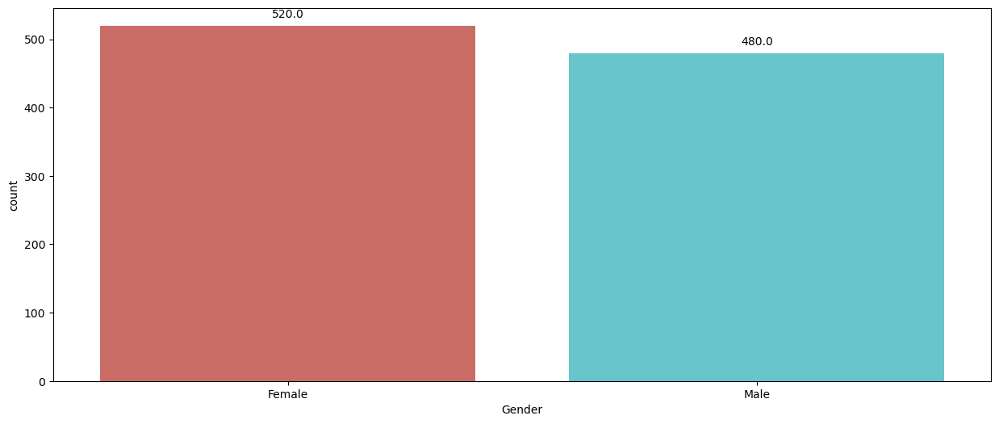

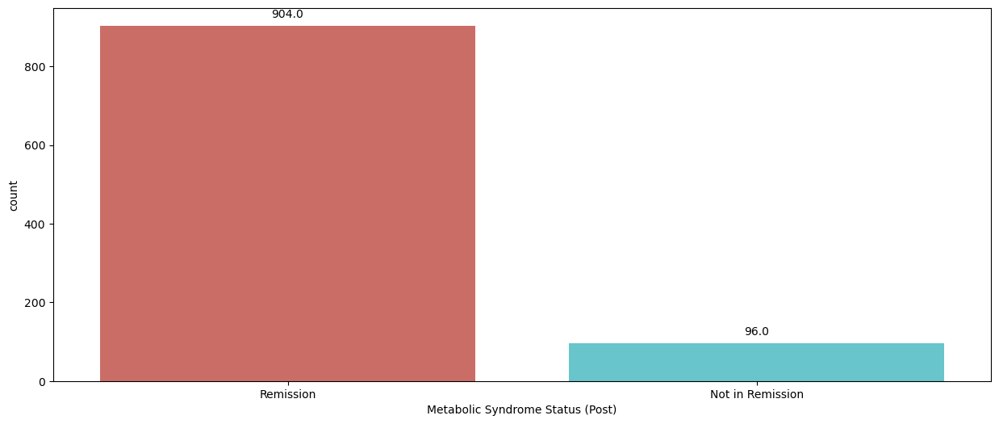

In [20]:
for i in categorical:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=df, palette='hls')

    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', 
                    xy=(p.get_x() + p.get_width() / 2., height),
                    xytext=(0, 10),  
                    textcoords='offset points',  
                    ha='center', va='center')  
    
    plt.show()

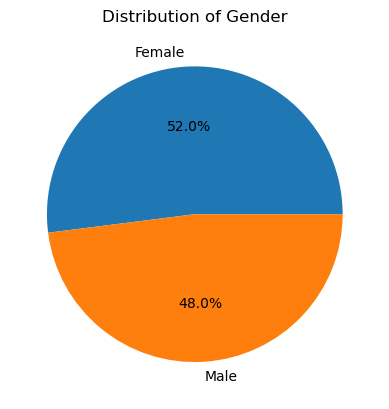

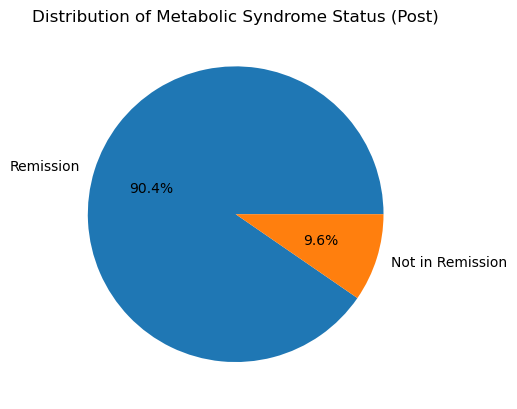

In [21]:
for i in categorical:
    counts = df[i].value_counts()

    plt.figure()
    plt.pie(counts.values, labels=counts.index, autopct='%1.1f%%')
    plt.title(f'Distribution of {i}')
    plt.show()

In [22]:
for i in discrete:
    print(i)
    print(df[i].unique())
    print()

Visceral Fat Pre (kg)
[20]

Diastolic BP Pre (mmHg)
[92 88 93 94 91 90 89 96 95]



In [23]:
for i in discrete:
    print(i)
    print(df[i].value_counts())
    print()

Visceral Fat Pre (kg)
Visceral Fat Pre (kg)
20    1000
Name: count, dtype: int64

Diastolic BP Pre (mmHg)
Diastolic BP Pre (mmHg)
92    128
95    120
96    115
90    114
93    110
91    108
94    107
89    100
88     98
Name: count, dtype: int64



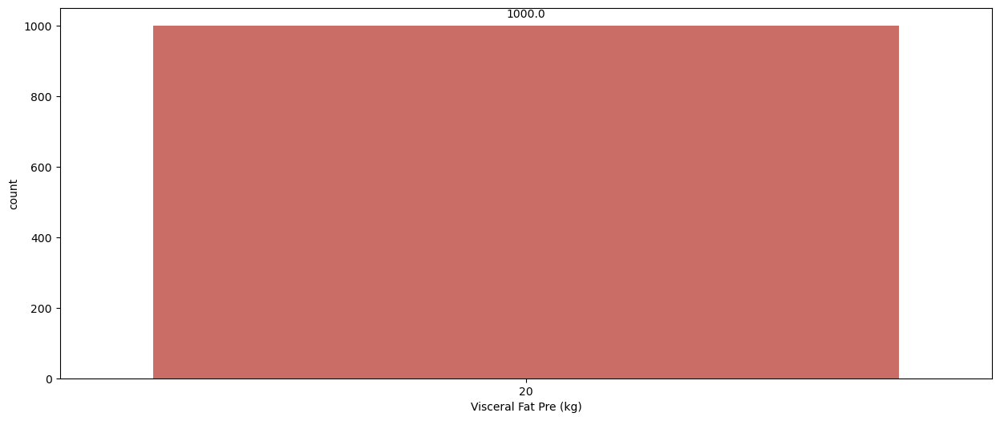

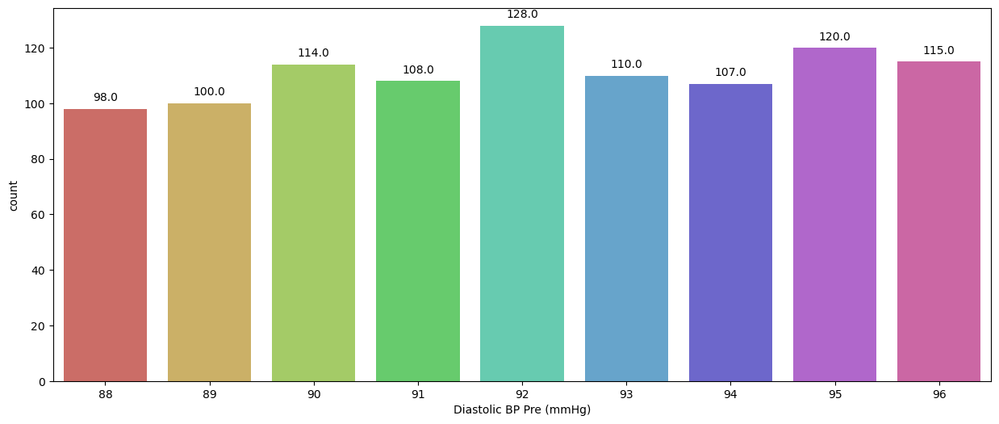

In [24]:
for i in discrete:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=df, palette='hls')

    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}', 
                    xy=(p.get_x() + p.get_width() / 2., height),
                    xytext=(0, 10),  
                    textcoords='offset points',  
                    ha='center', va='center')  
    
    plt.show()

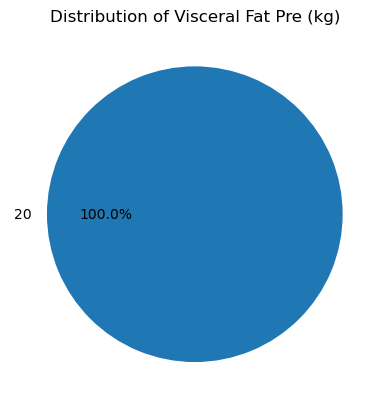

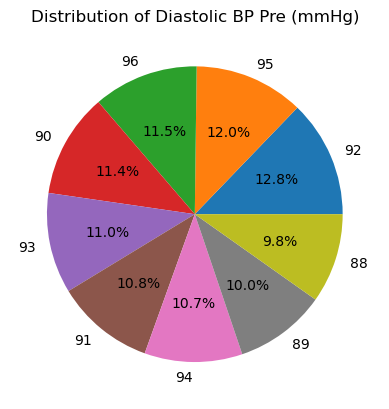

In [25]:
for i in discrete:
    counts = df[i].value_counts()

    plt.figure()
    plt.pie(counts.values, labels=counts.index, autopct='%1.1f%%')
    plt.title(f'Distribution of {i}')
    plt.show()

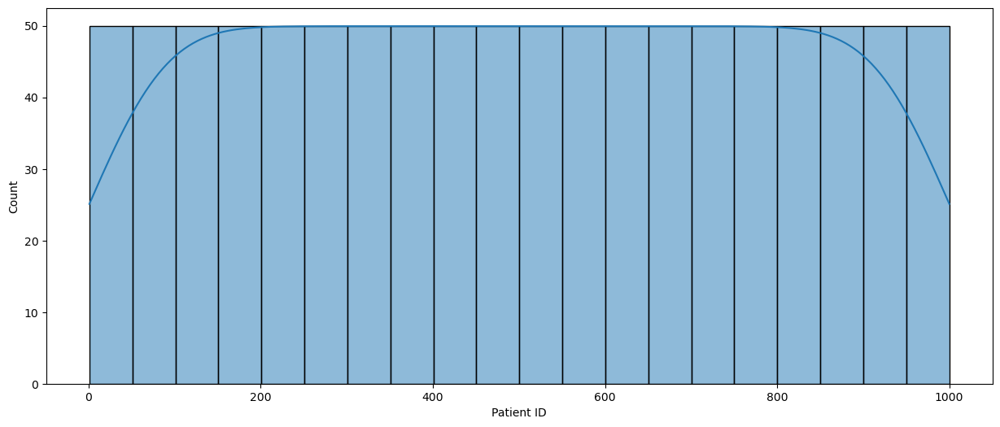

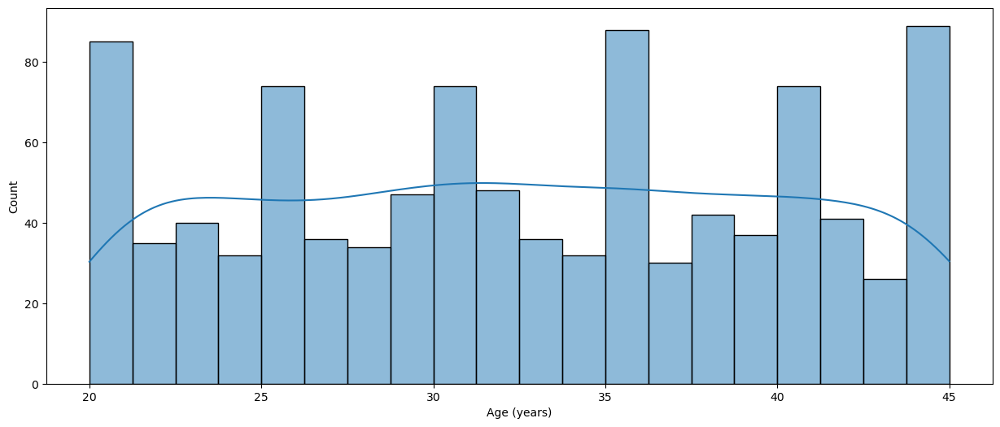

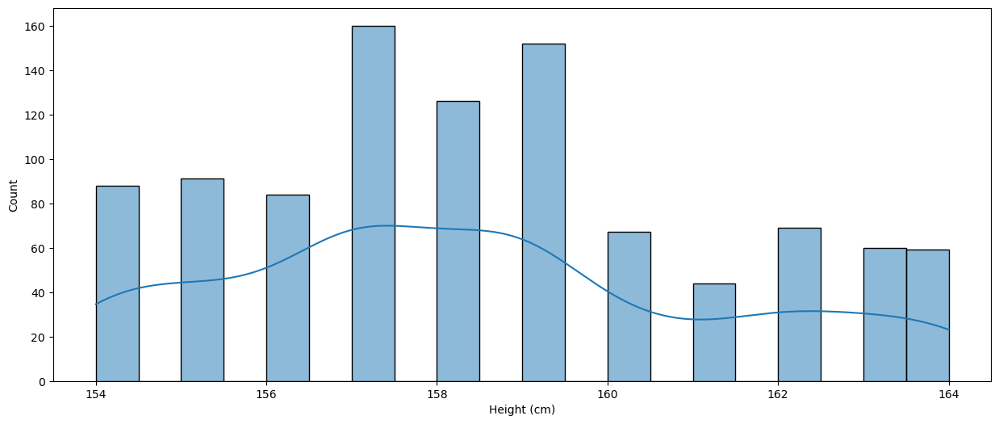

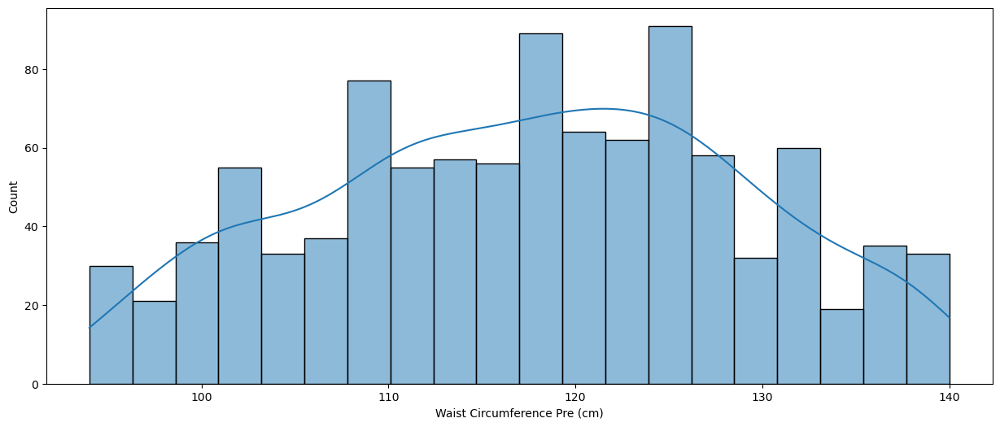

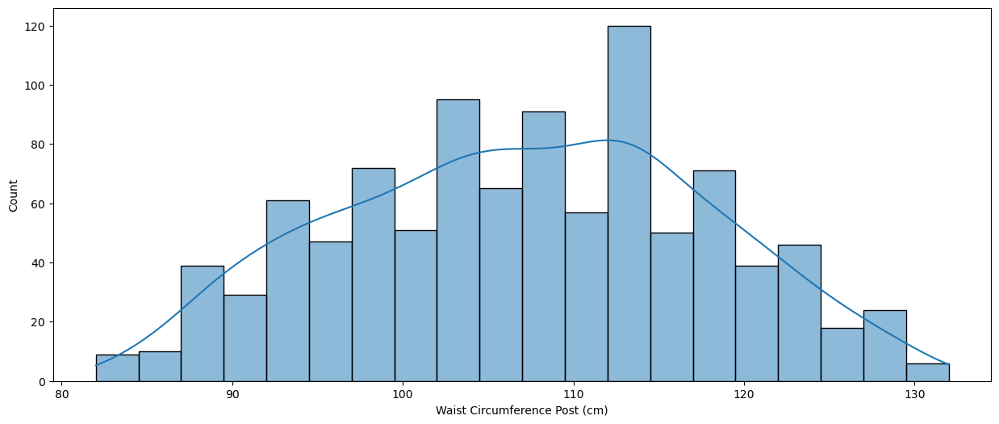

...

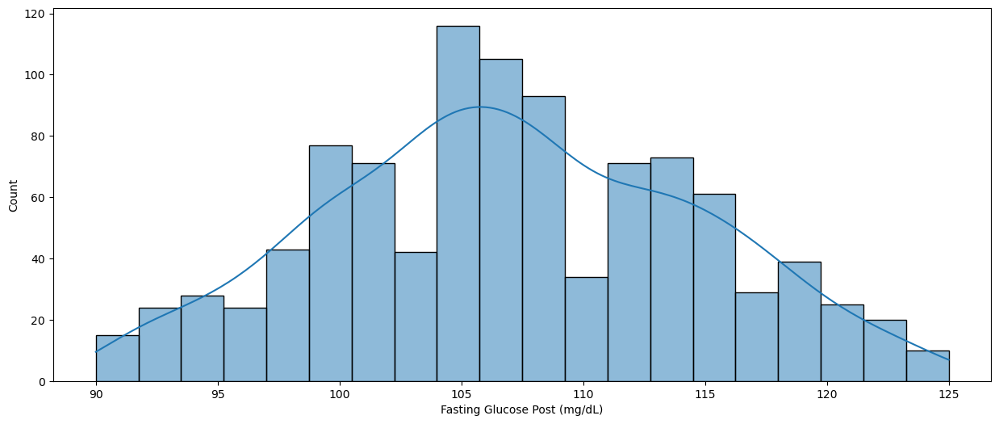

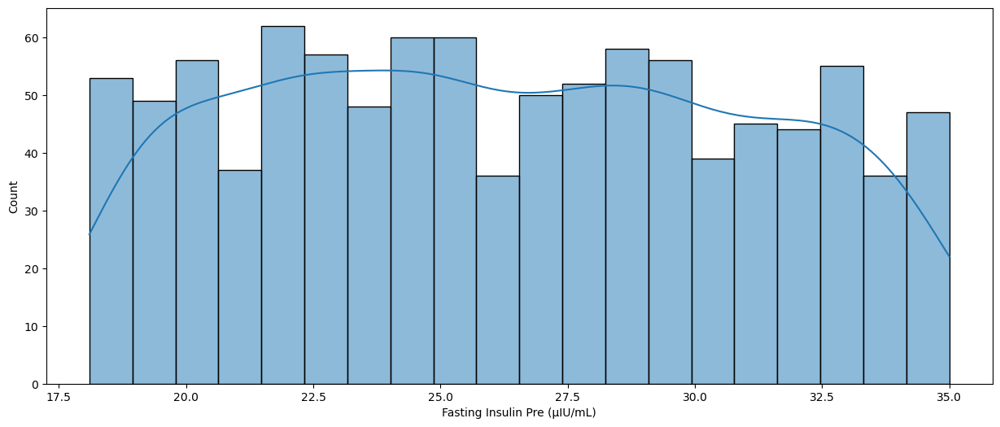

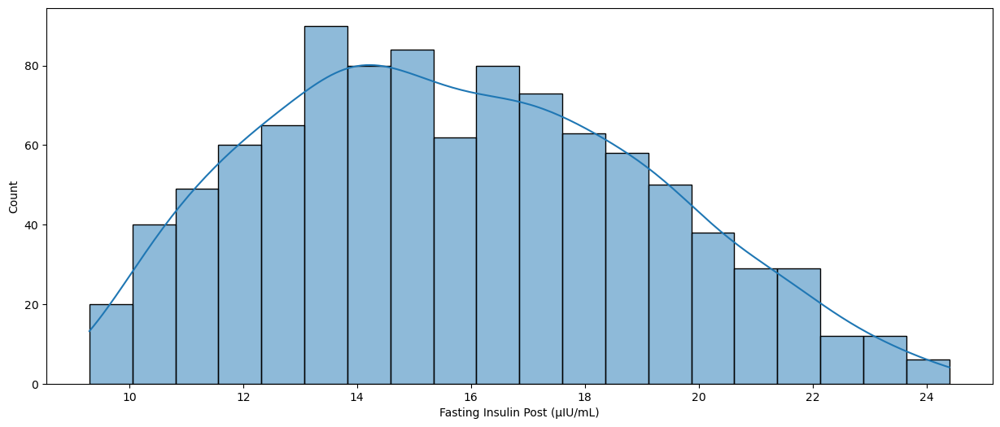

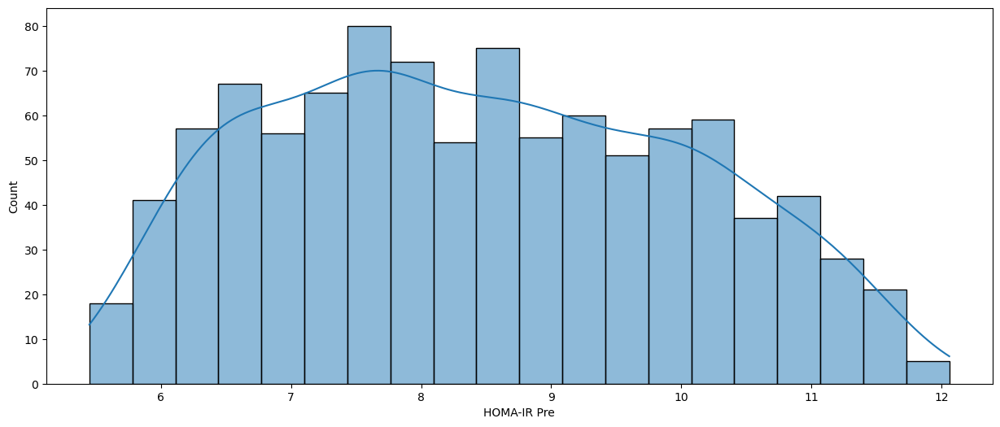

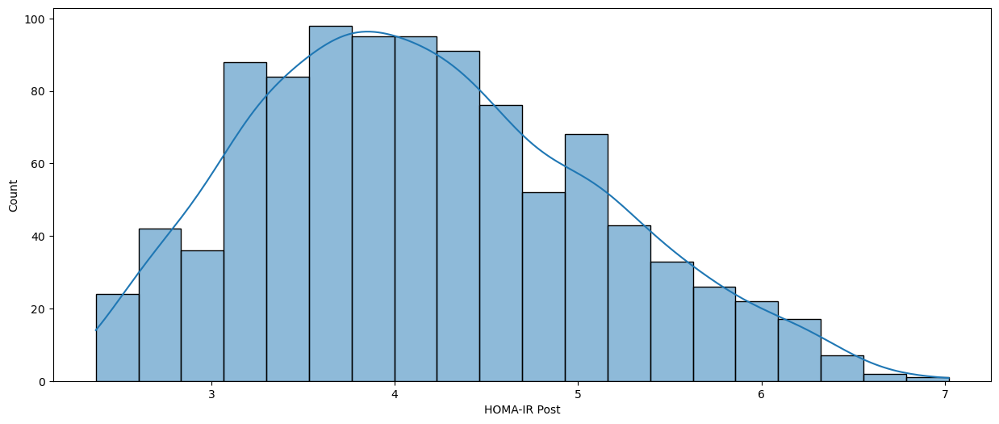

In [26]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], kde = True, bins = 20, palette = 'hls')
    plt.xticks(rotation = 0)
    plt.show()

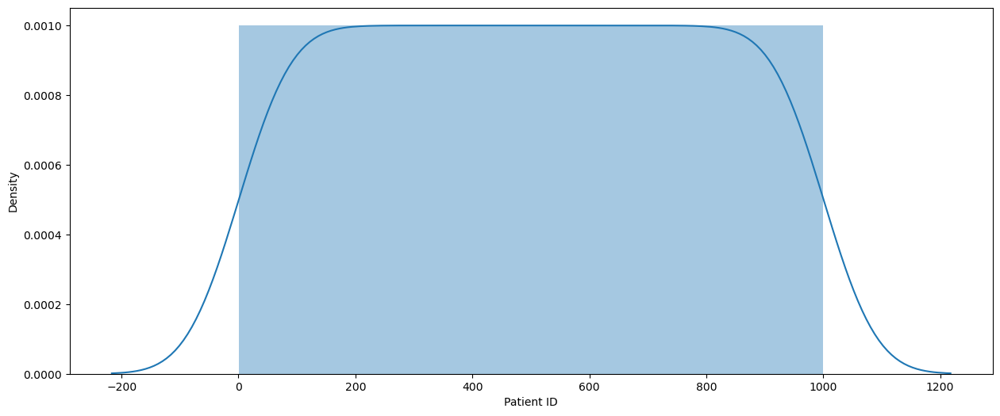

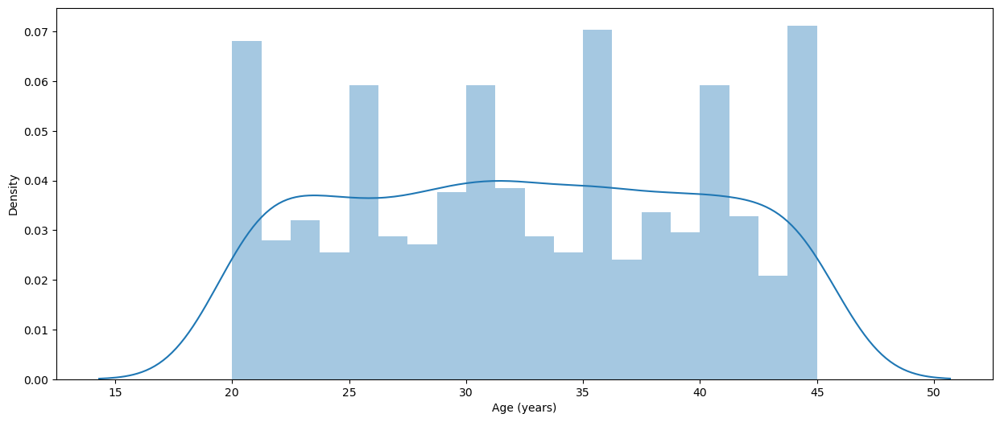

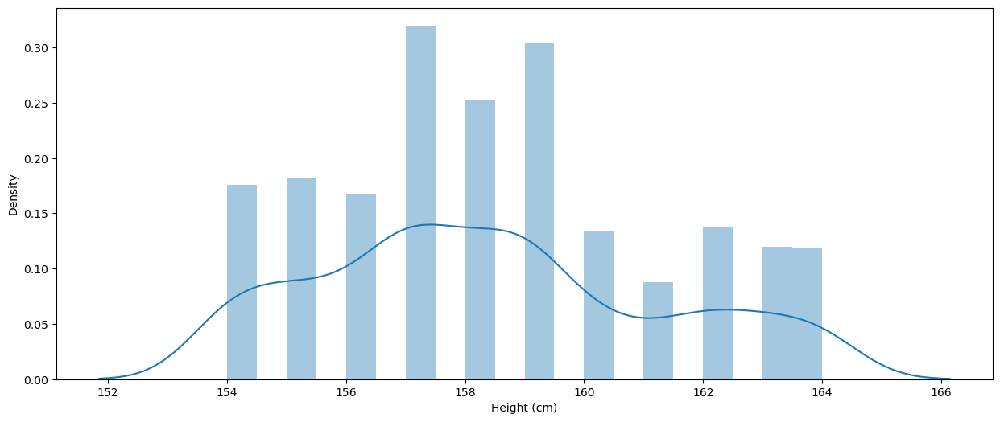

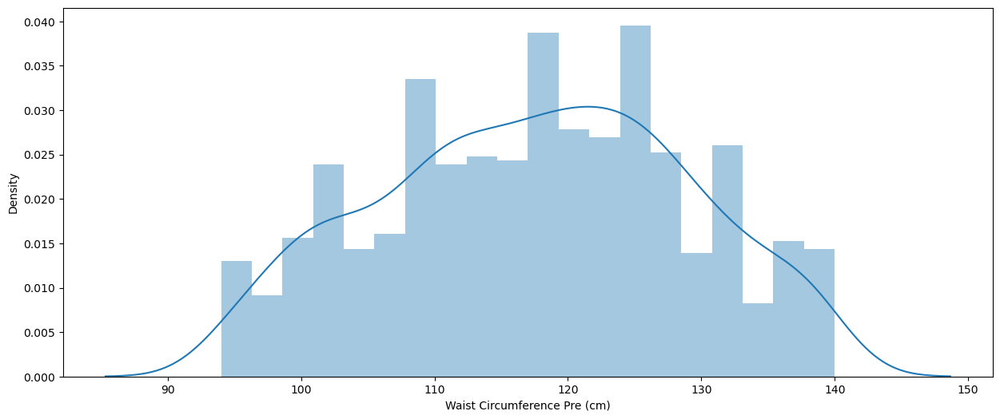

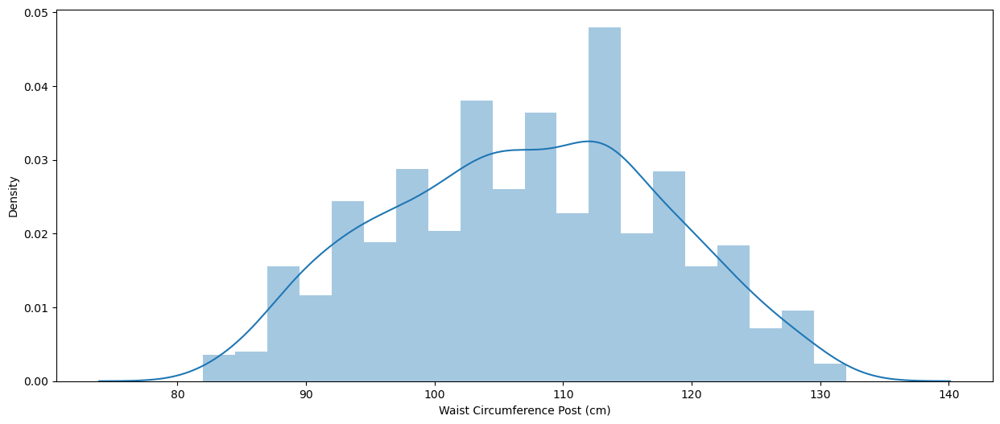

...

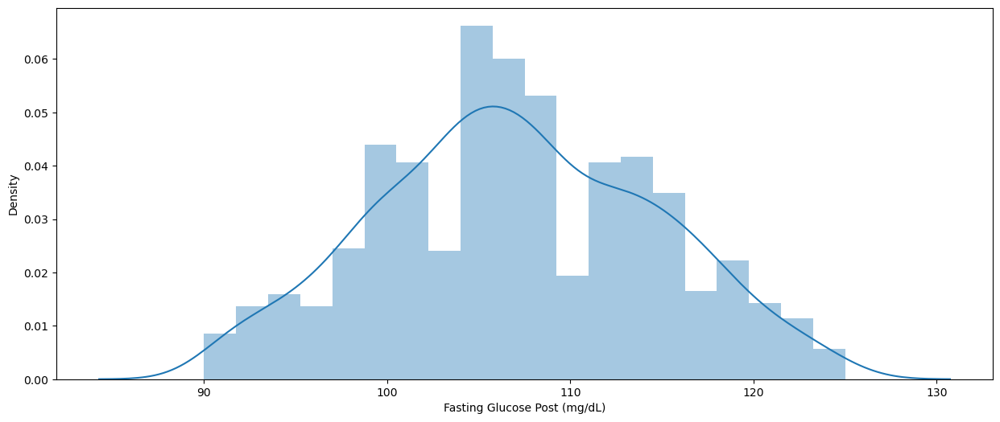

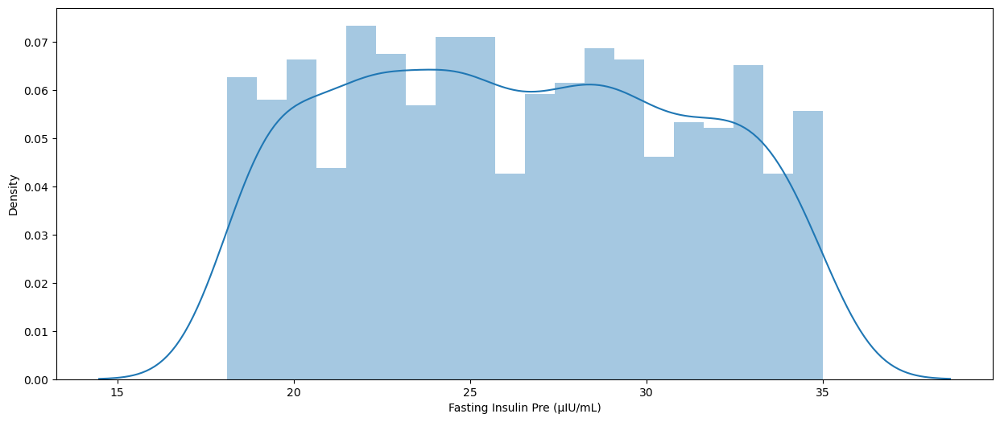

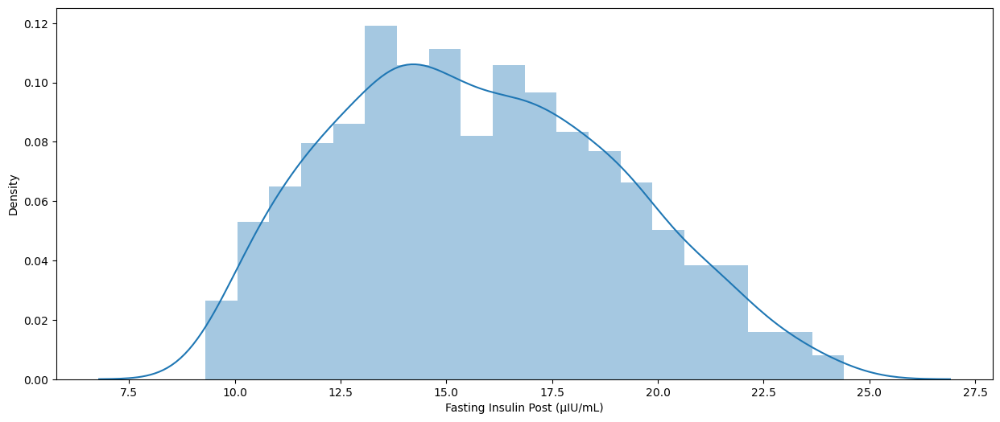

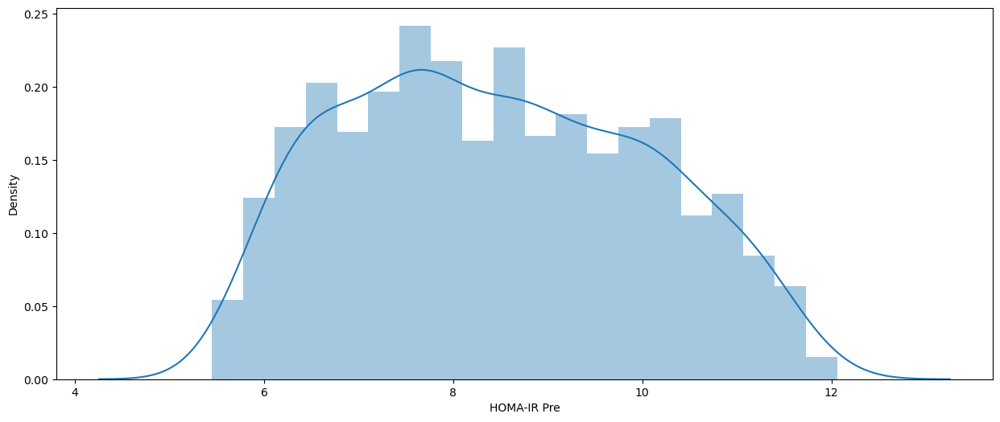

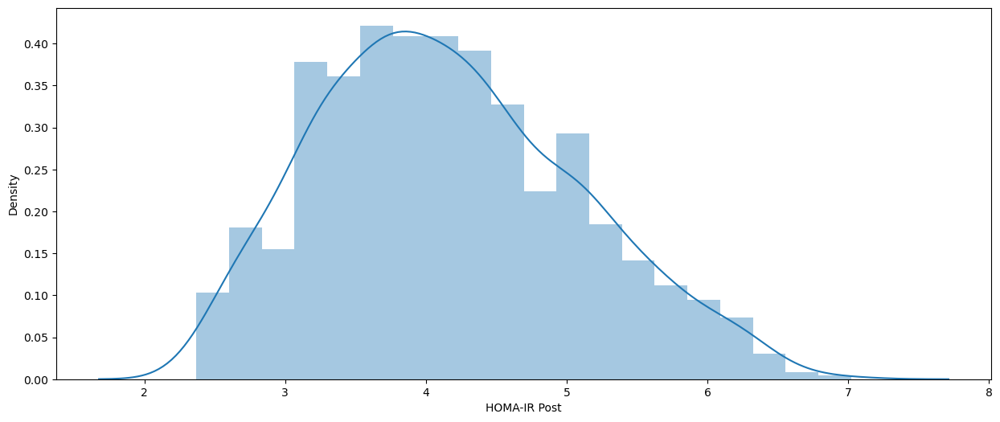

In [27]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], kde = True, bins = 20)
    plt.xticks(rotation = 0)
    plt.show()

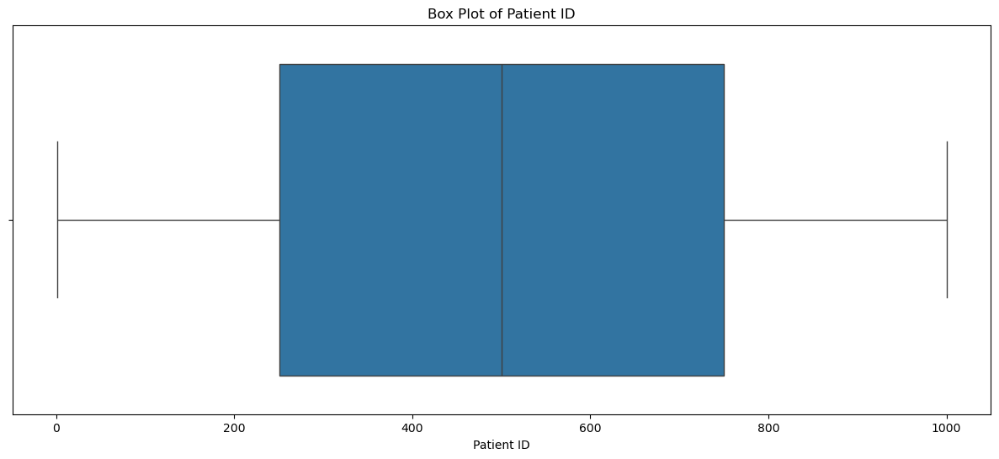

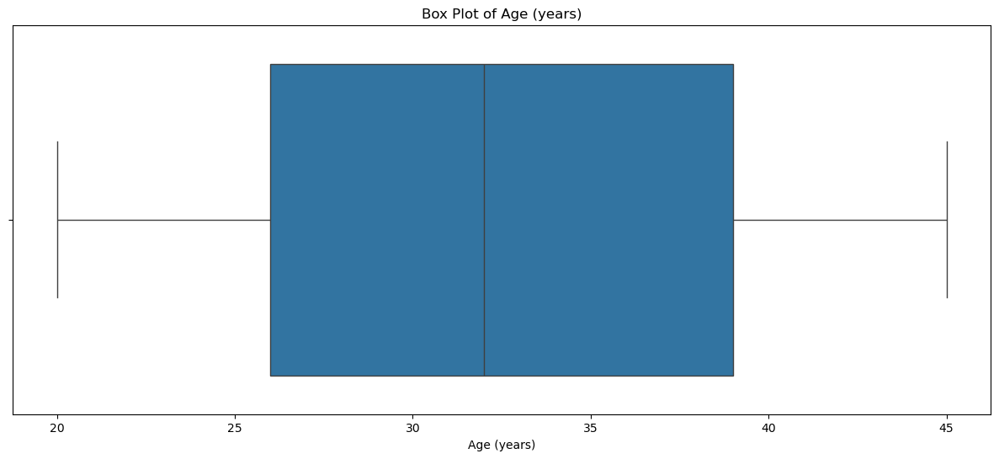

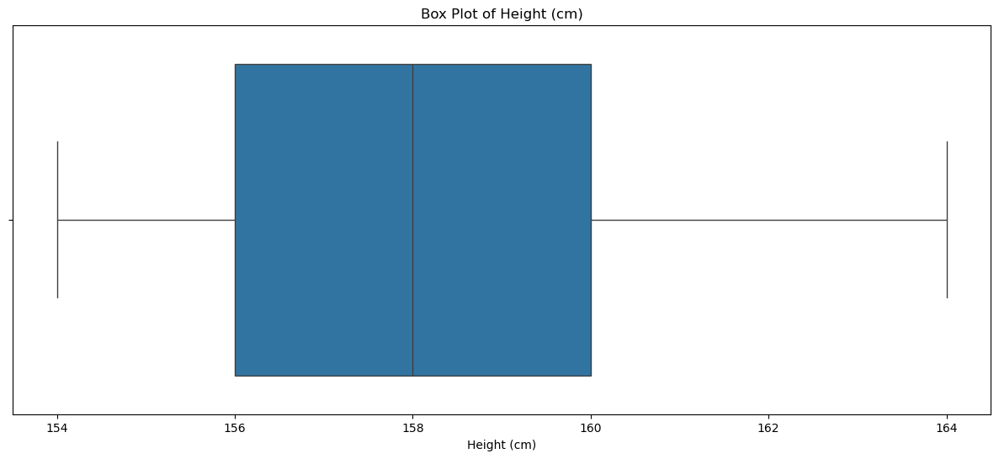

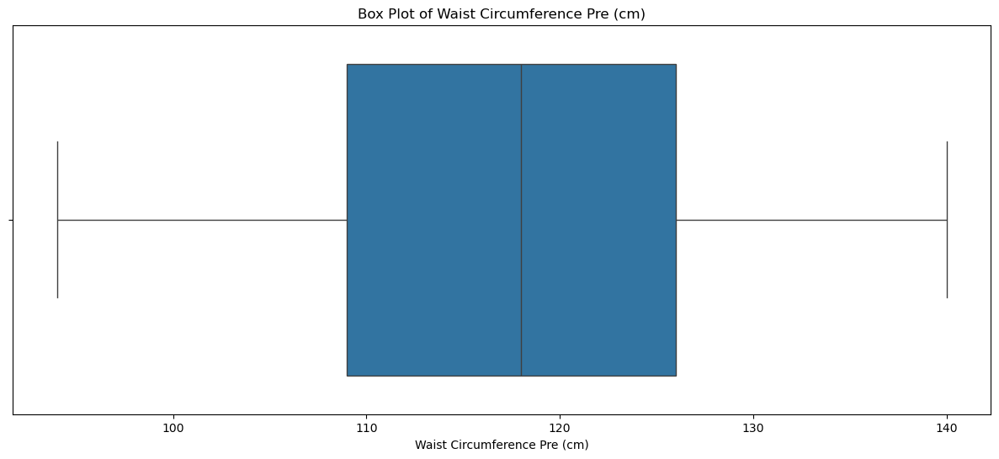

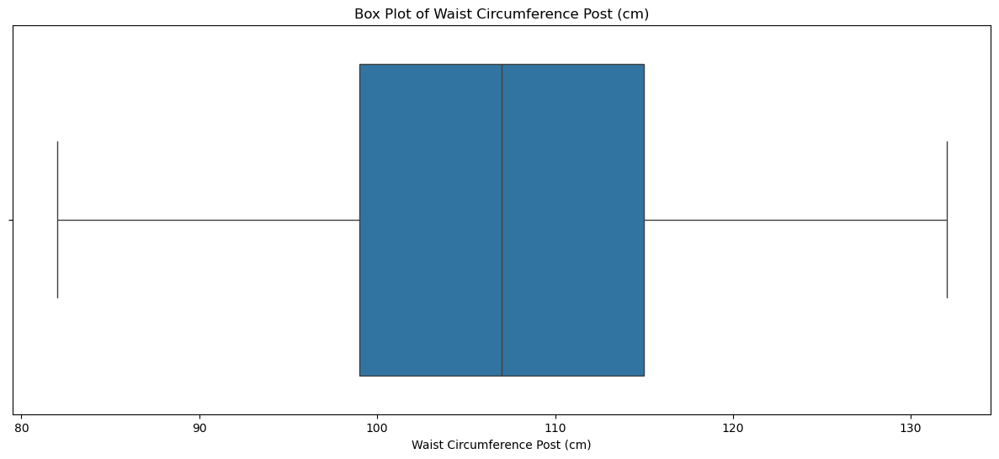

...

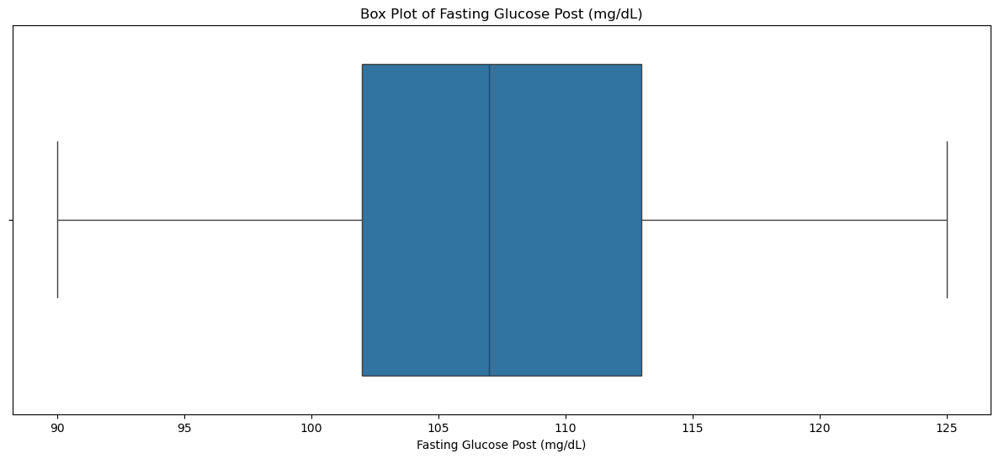

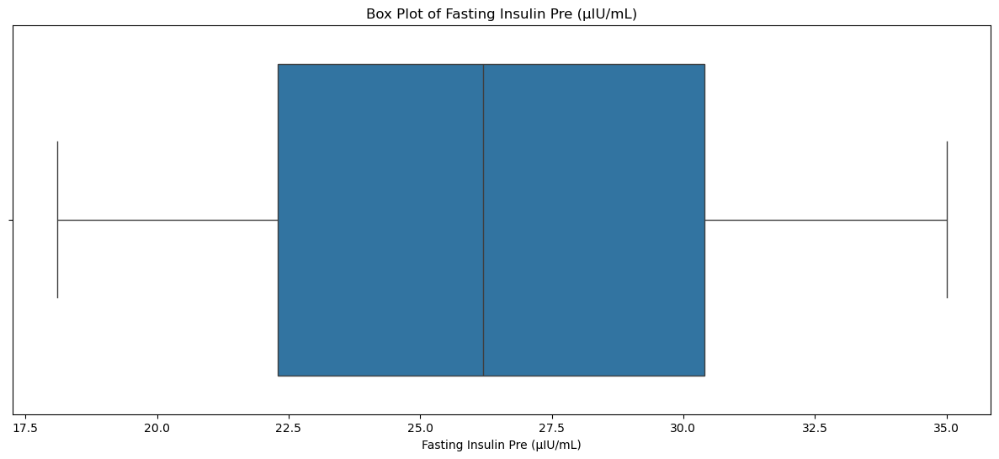

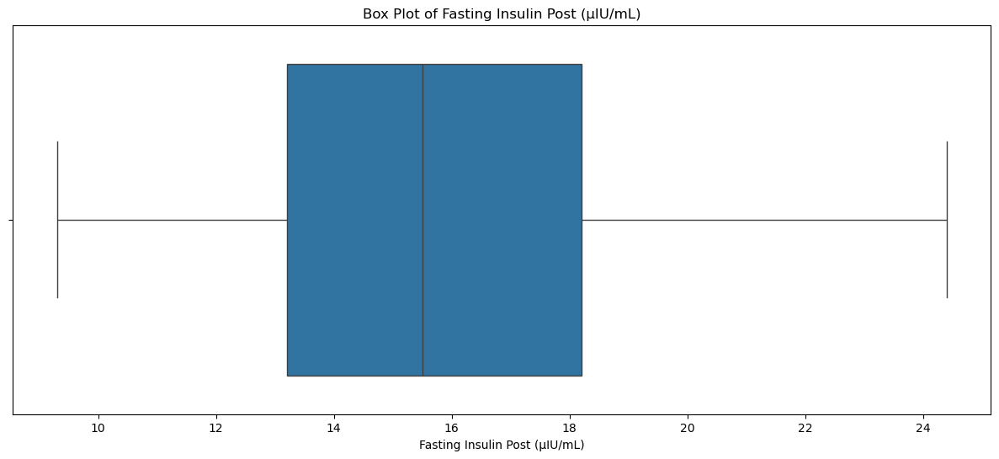

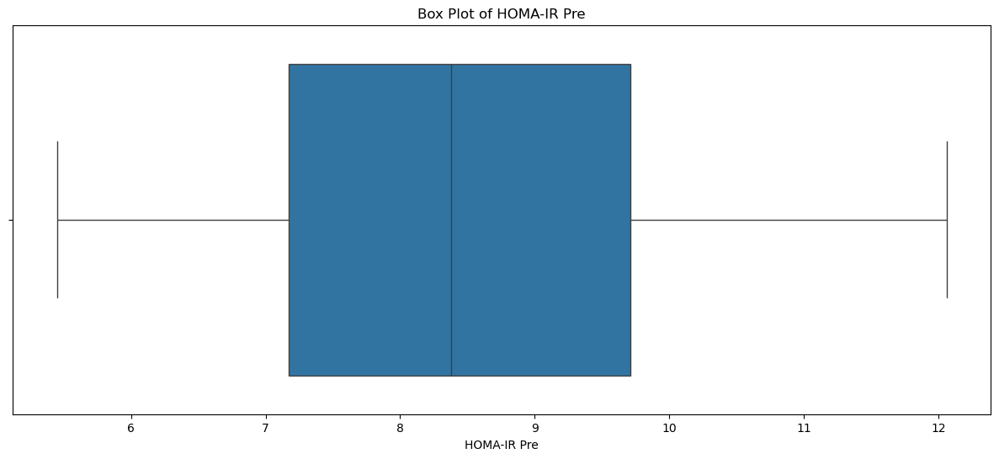

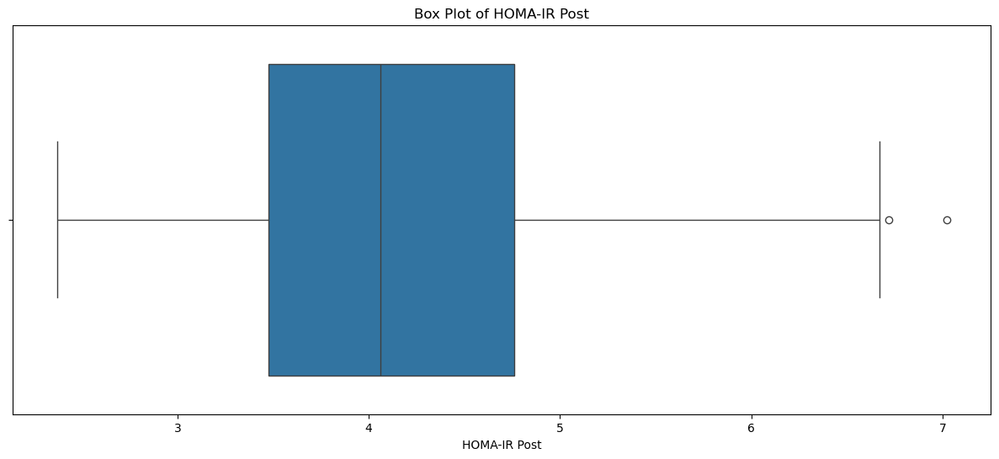

In [28]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxplot(x=df[i])
    plt.title(f'Box Plot of {i}')
    plt.xlabel(i)
    plt.show()

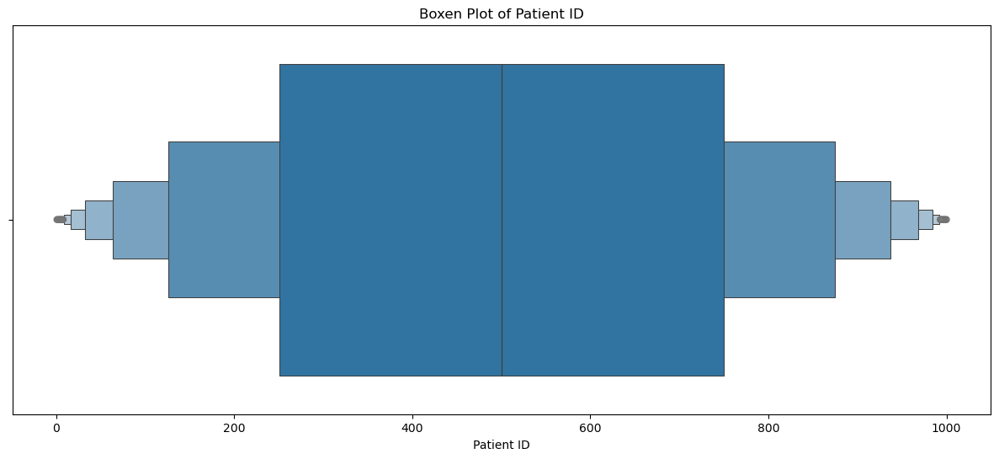

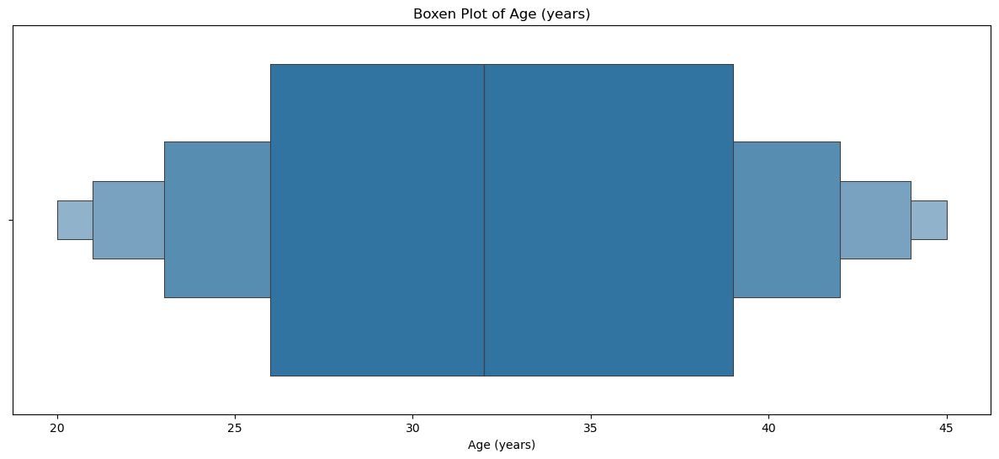

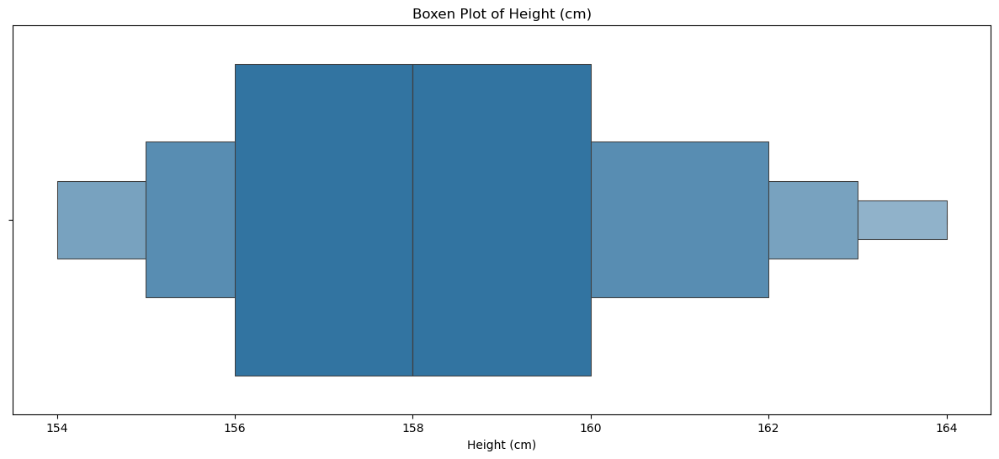

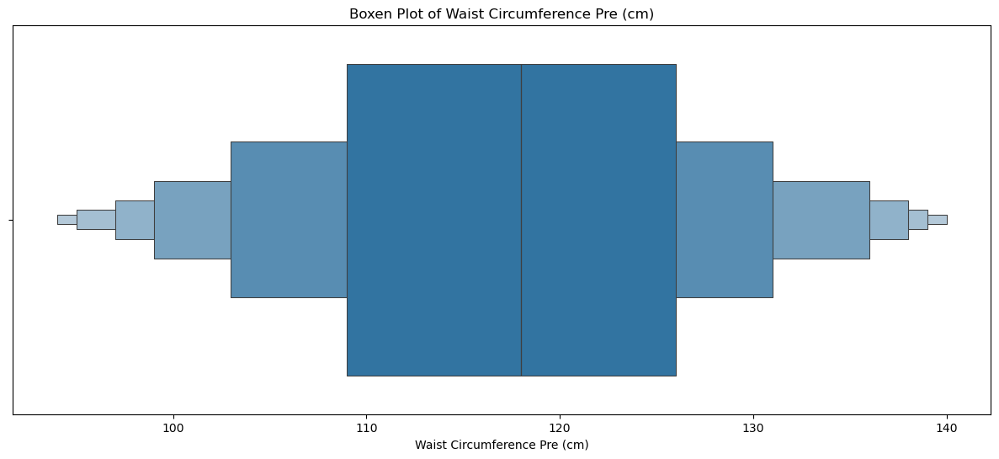

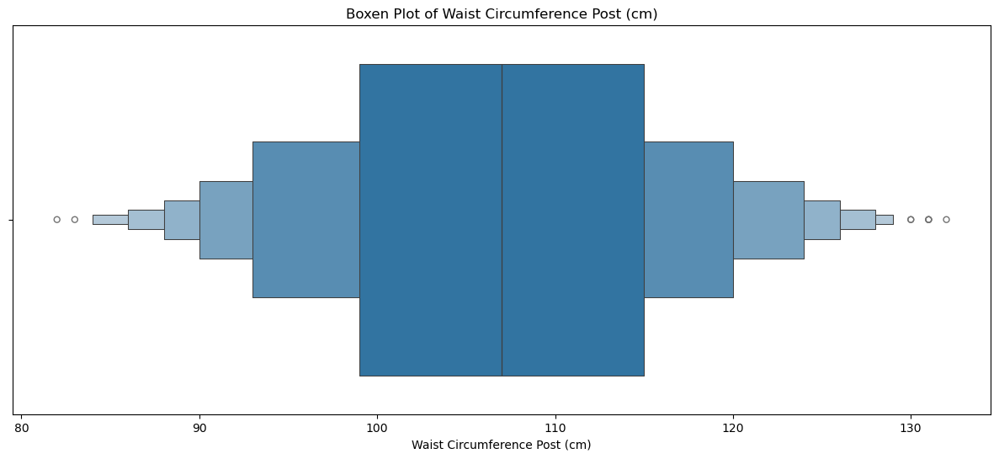

...

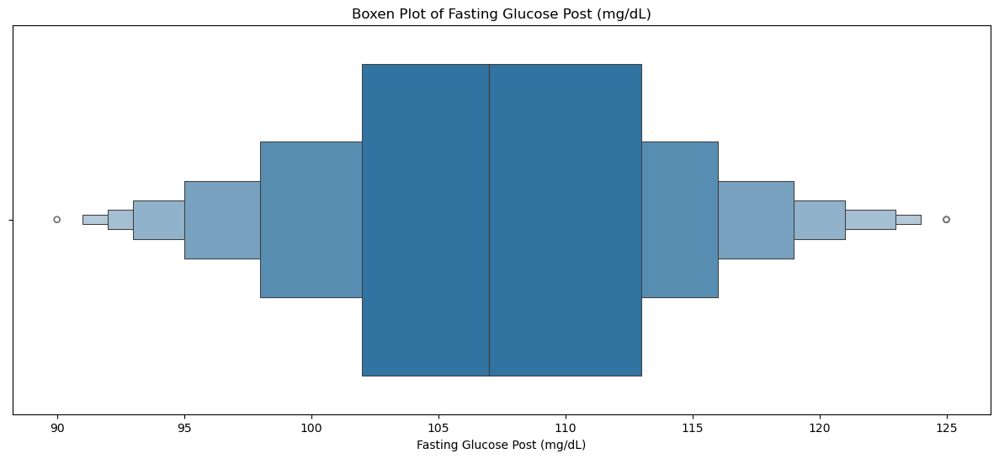

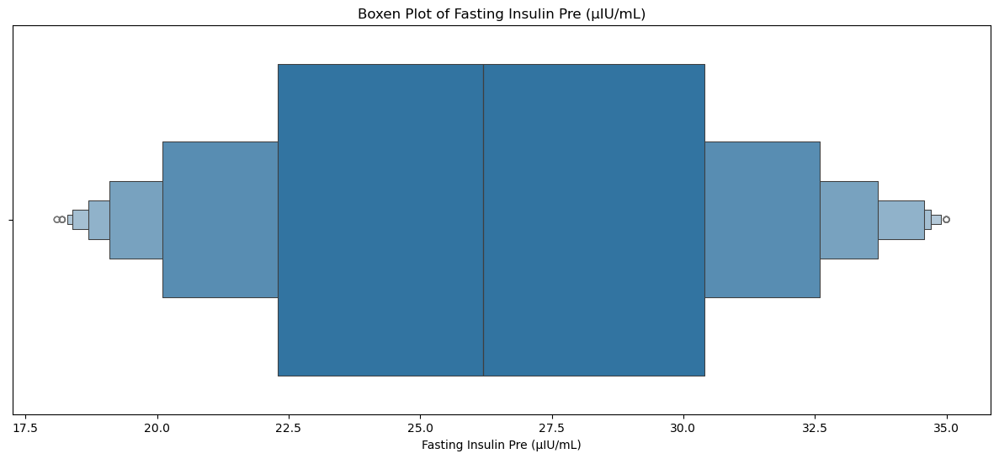

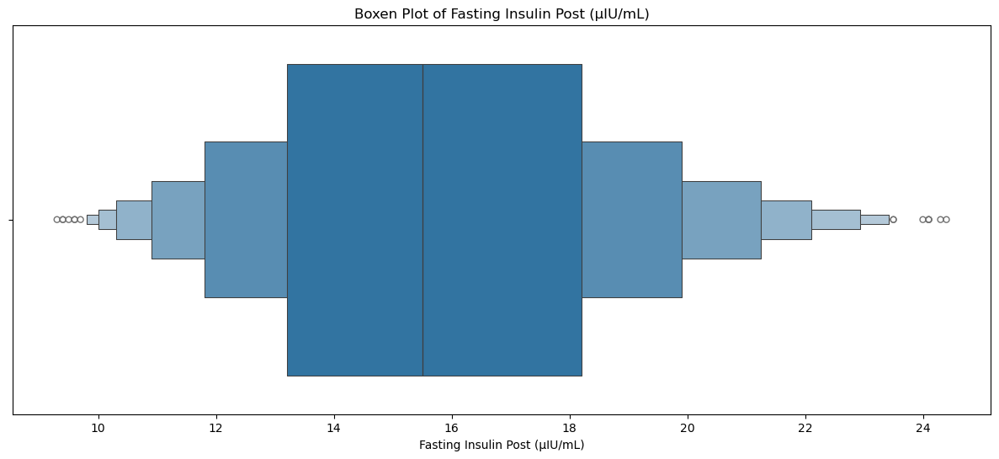

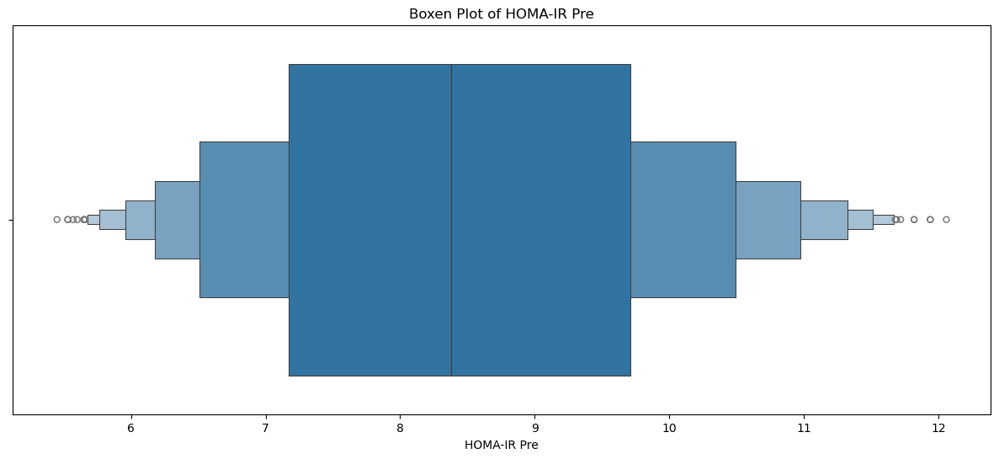

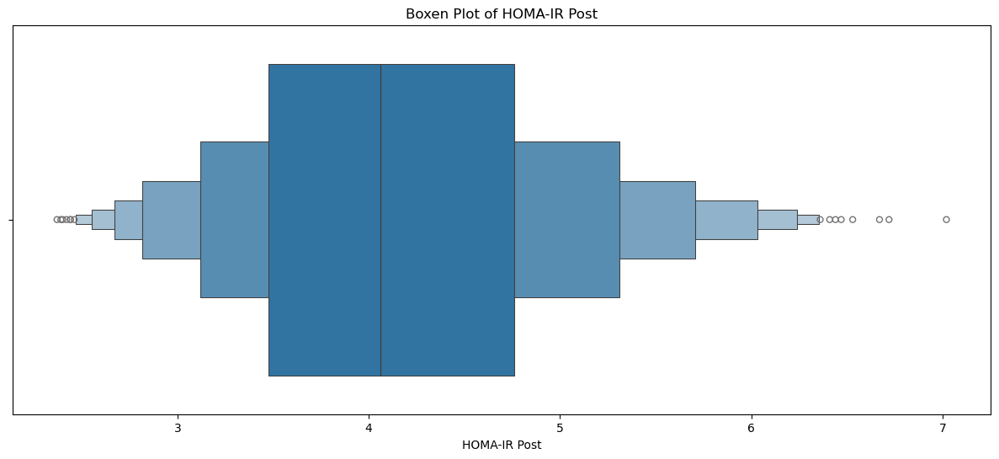

In [29]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.boxenplot(x=df[i])
    plt.title(f'Boxen Plot of {i}')
    plt.xlabel(i)
    plt.show()

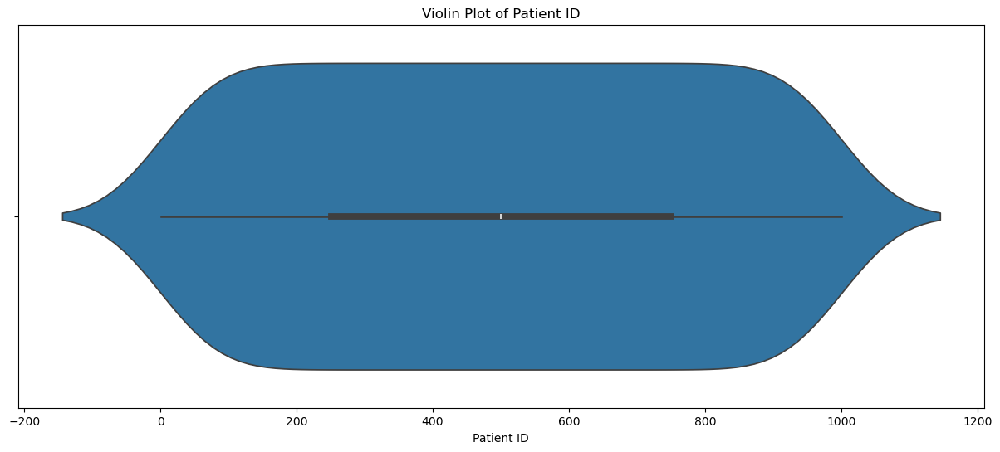

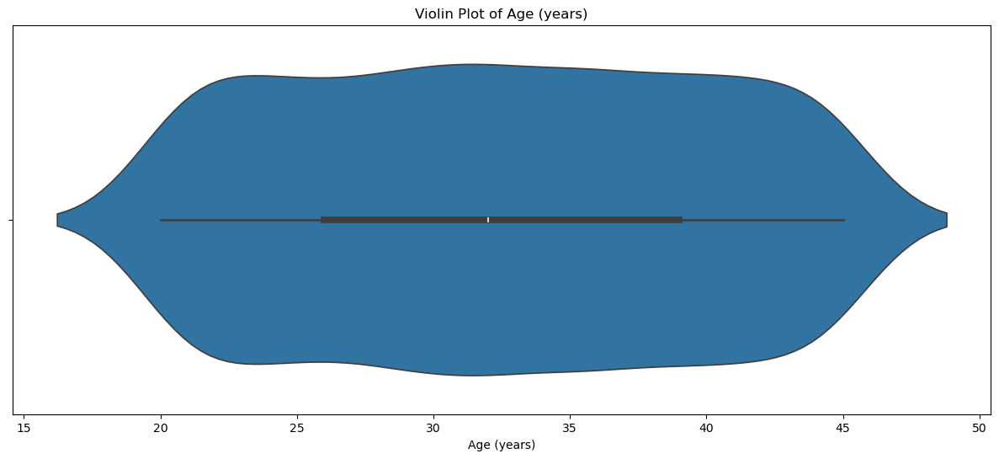

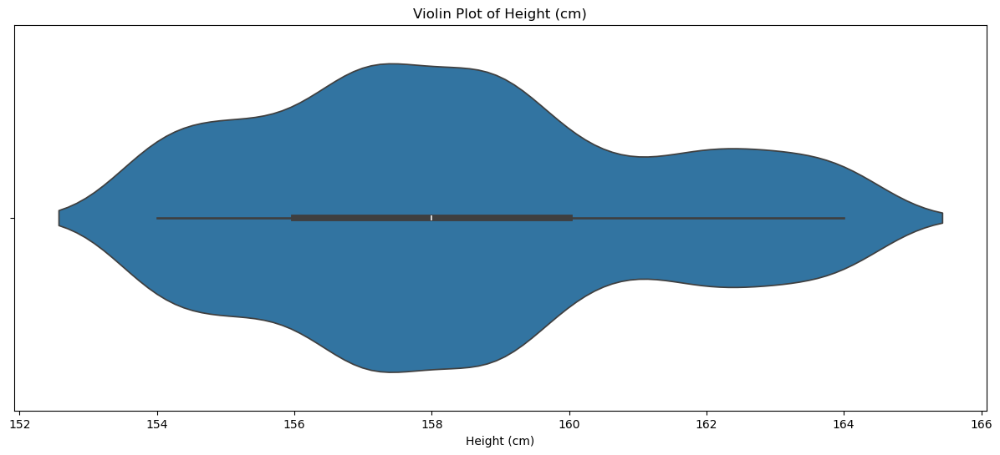

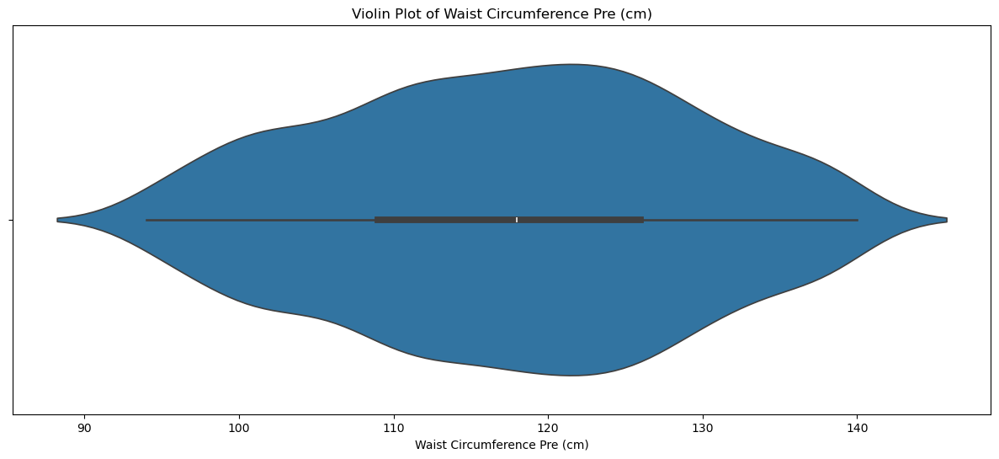

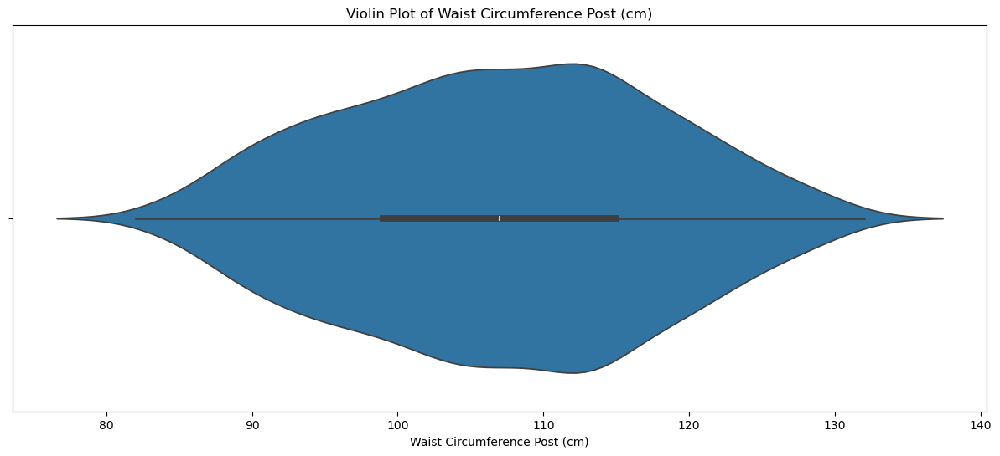

...

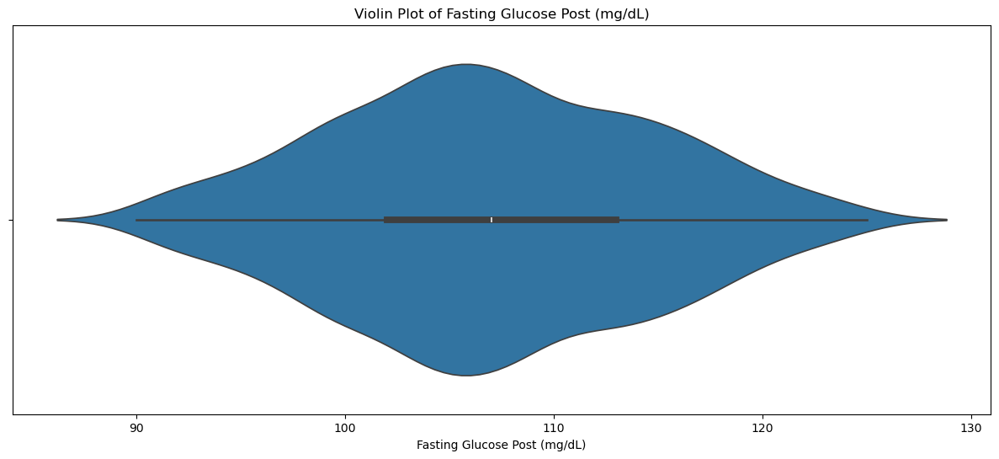

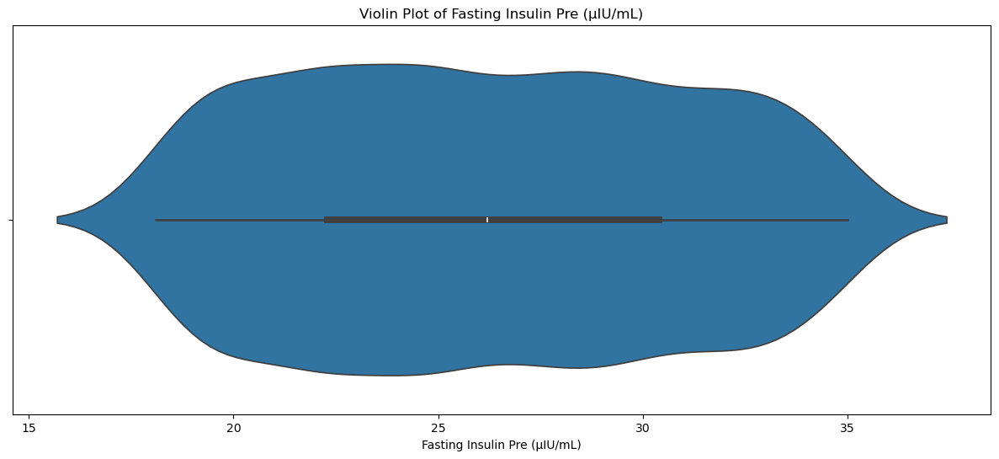

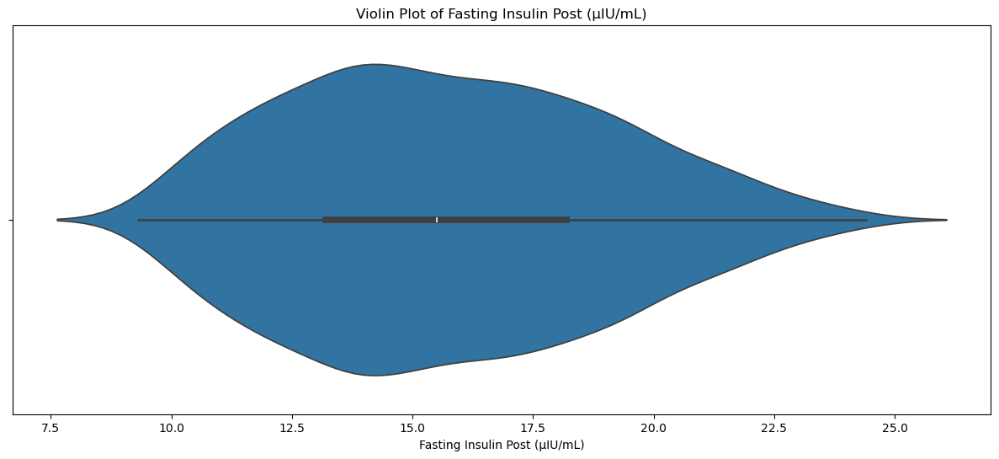

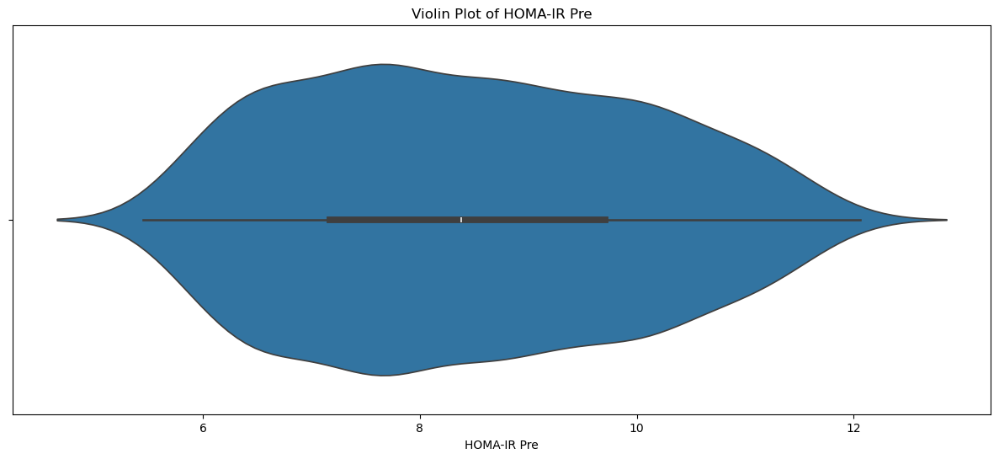

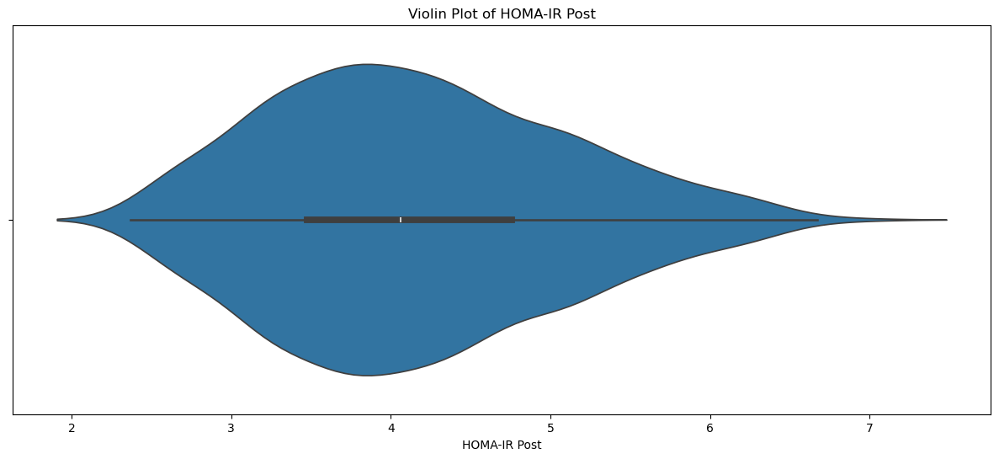

In [30]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.violinplot(x=df[i])
    plt.title(f'Violin Plot of {i}')
    plt.xlabel(i)
    plt.show()

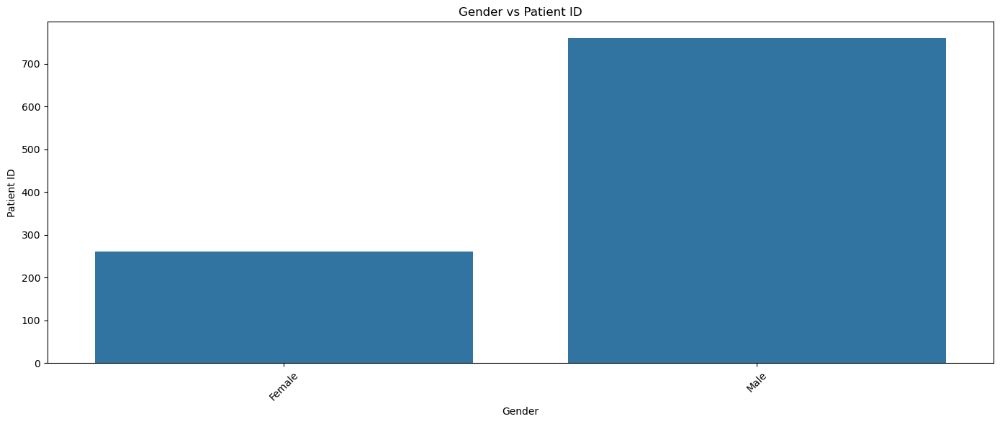

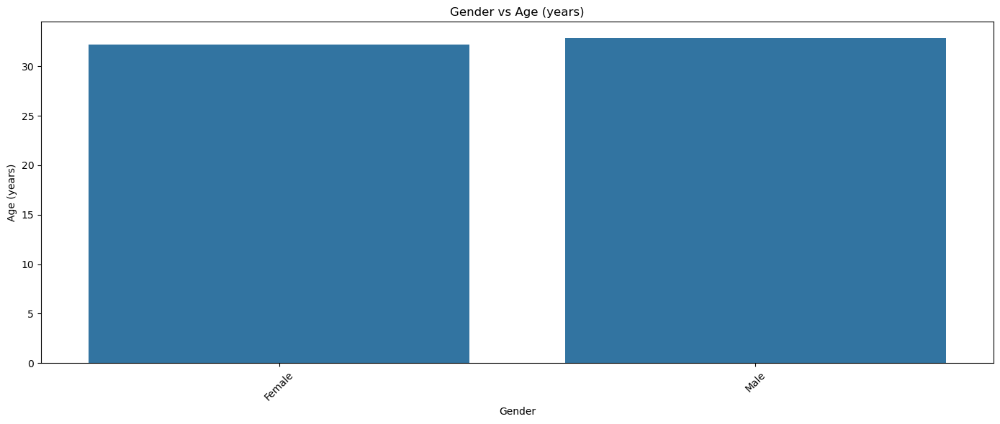

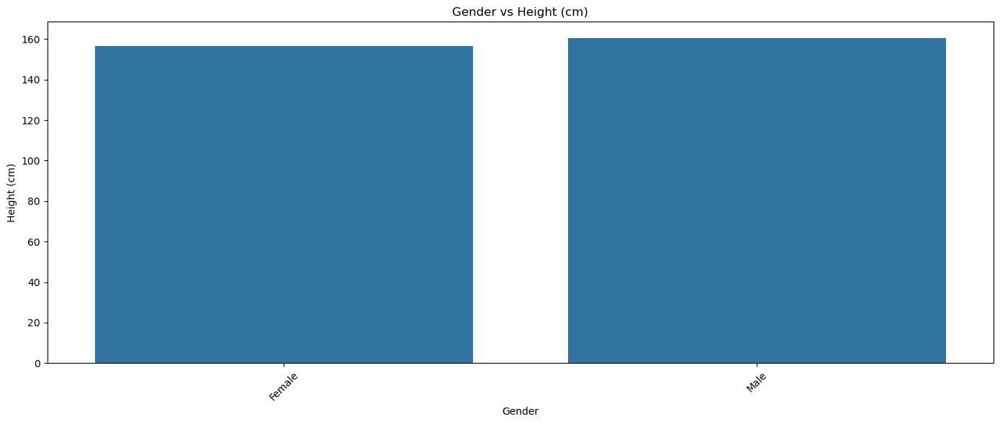

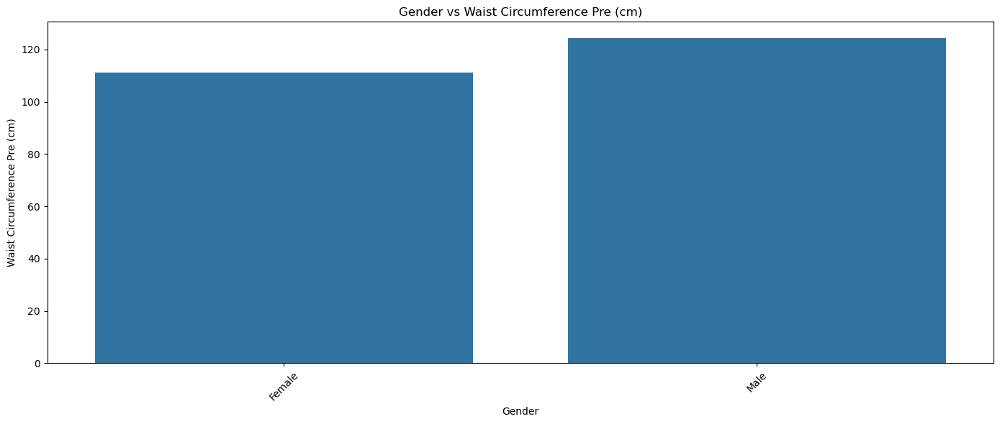

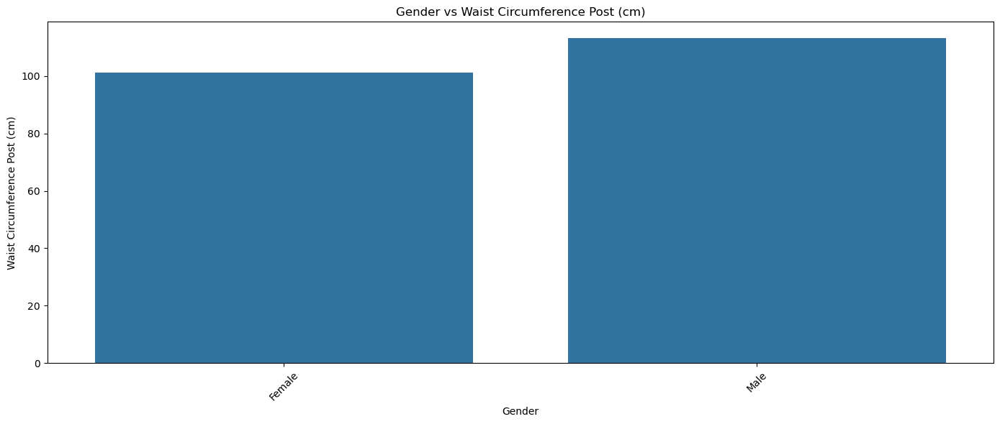

...

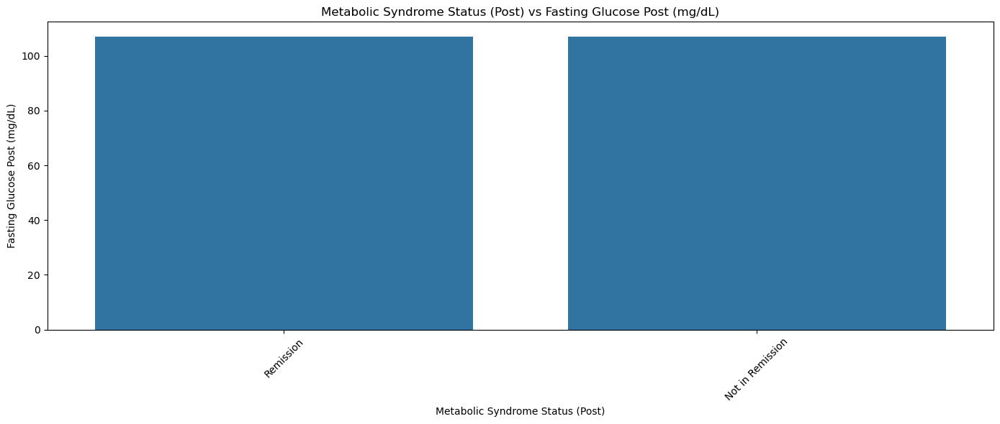

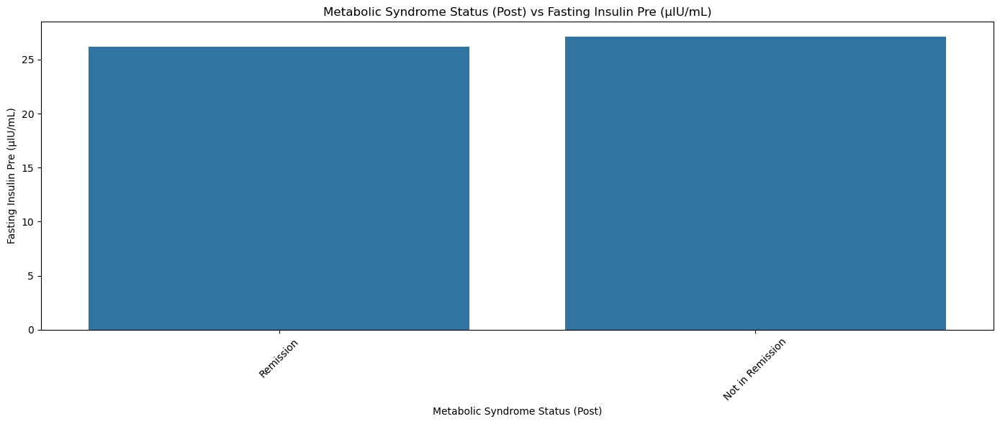

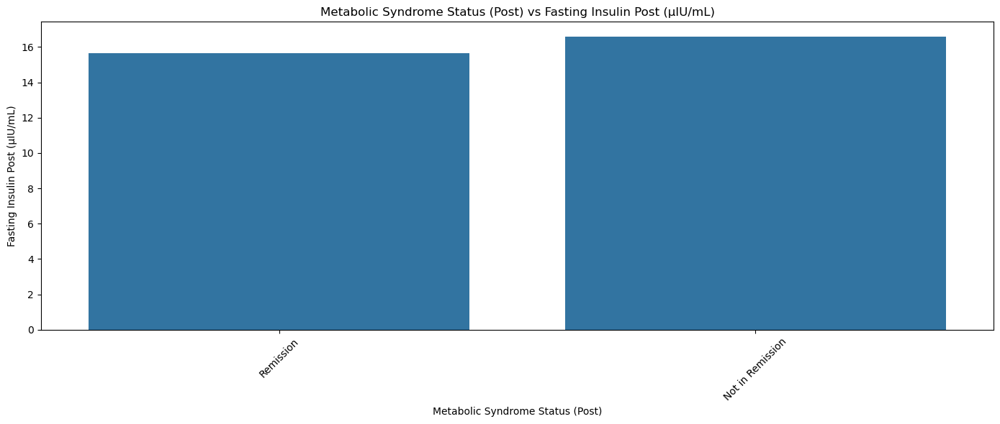

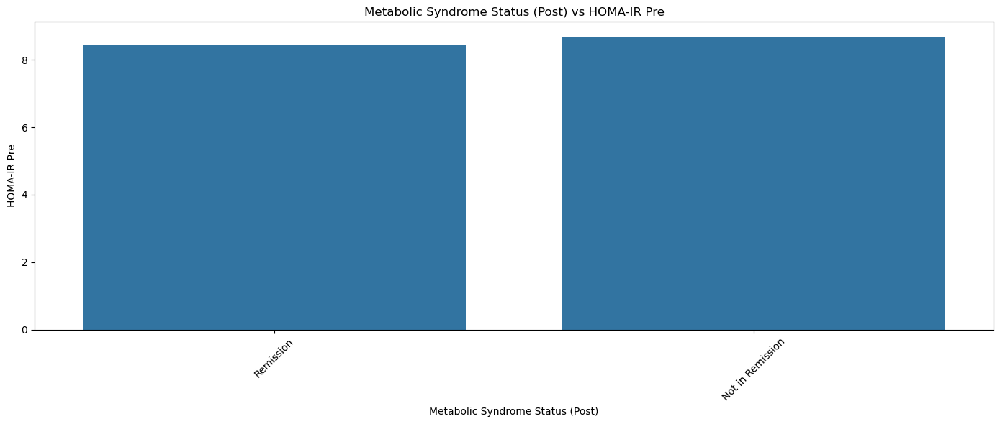

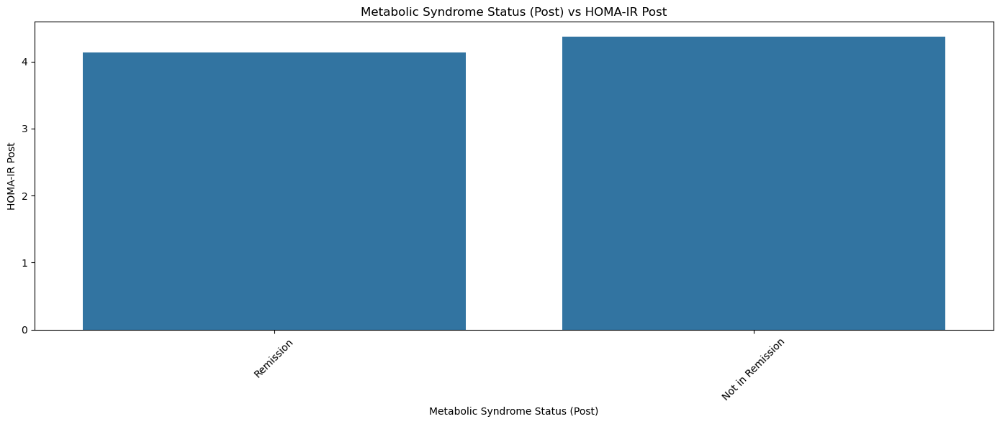

In [31]:
for cat in categorical:
    for con in continuous:
        plt.figure(figsize=(14,6))
        sns.barplot(x=df[cat], y=df[con], estimator='mean', errorbar='sd', ci = None)  
        plt.title(f'{cat} vs {con}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

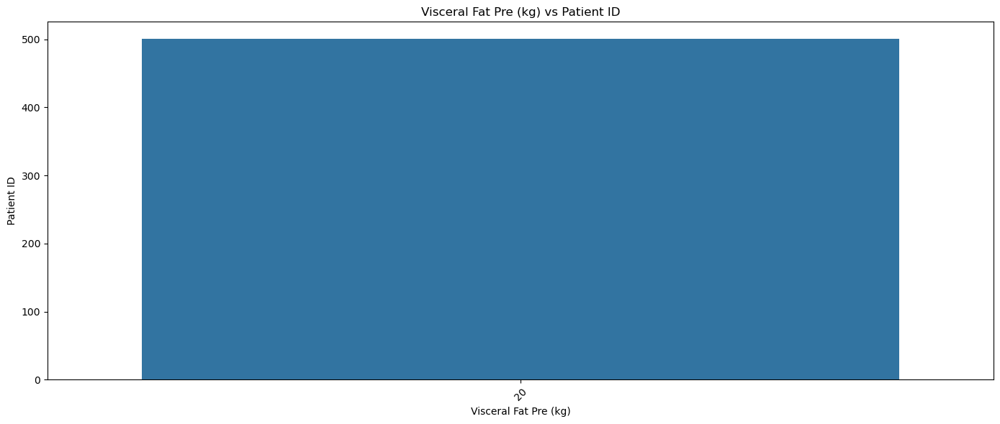

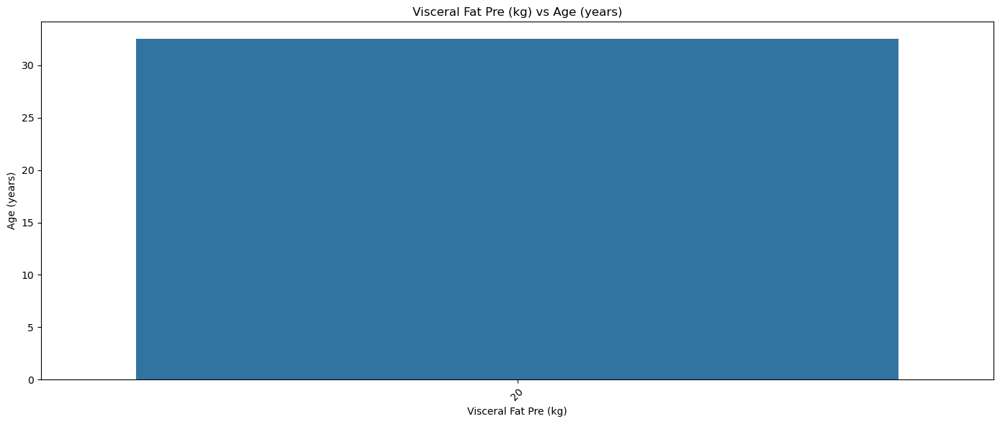

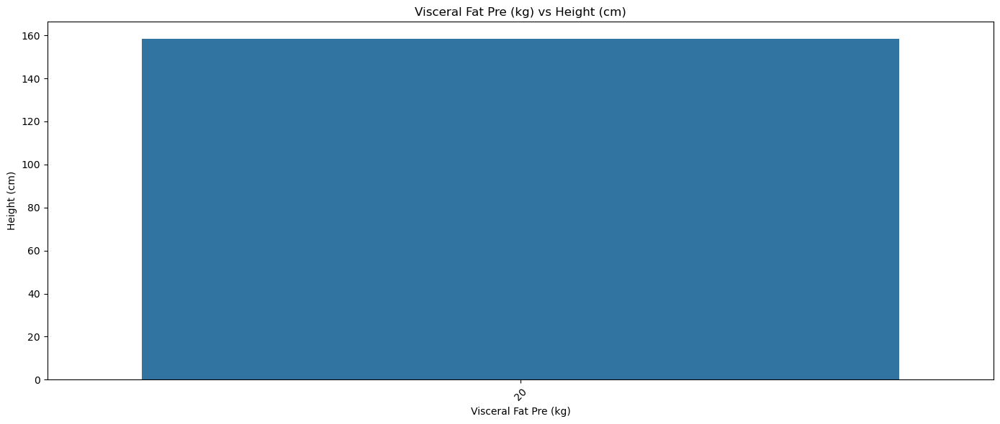

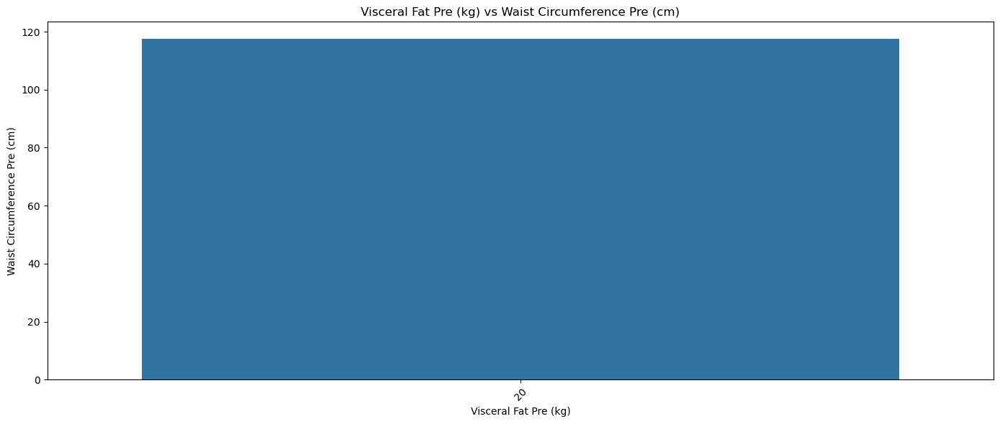

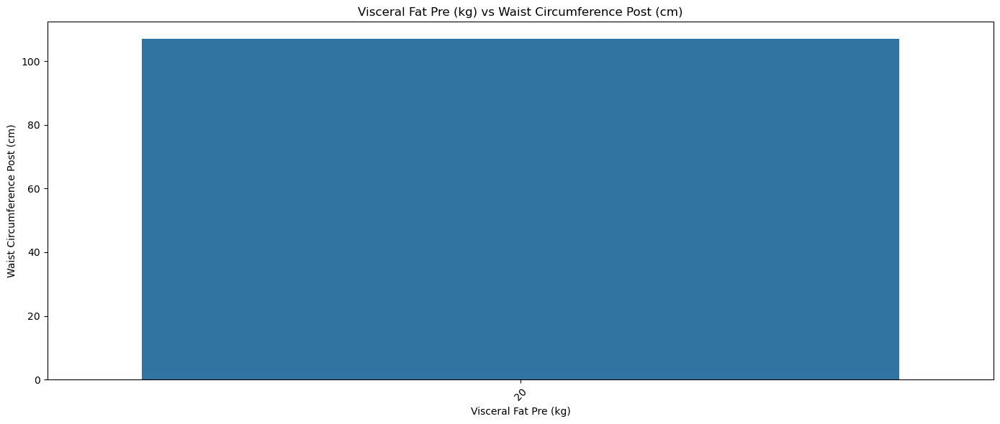

...

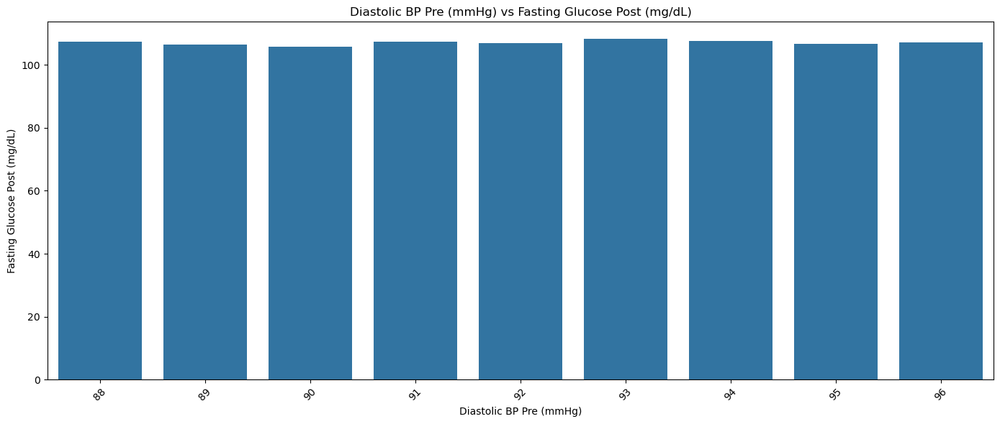

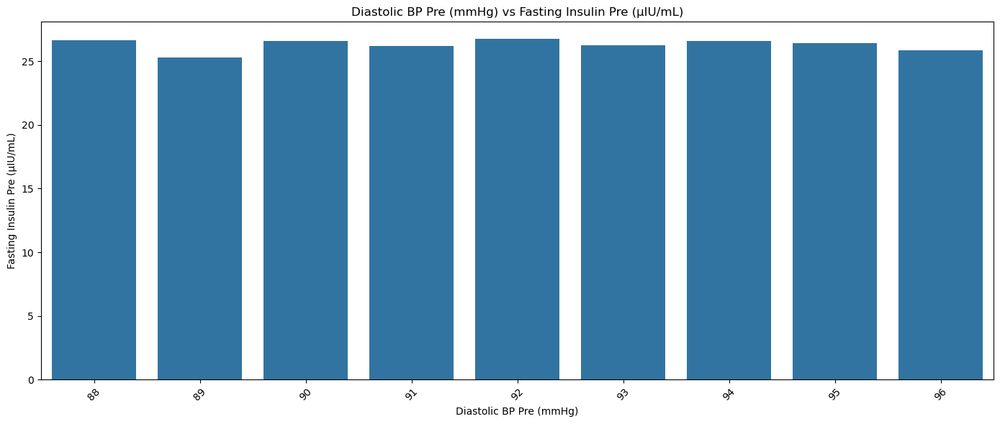

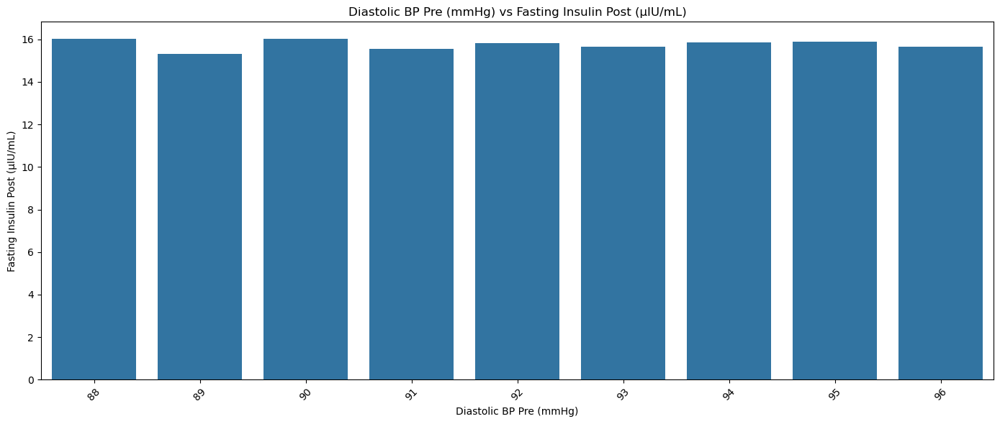

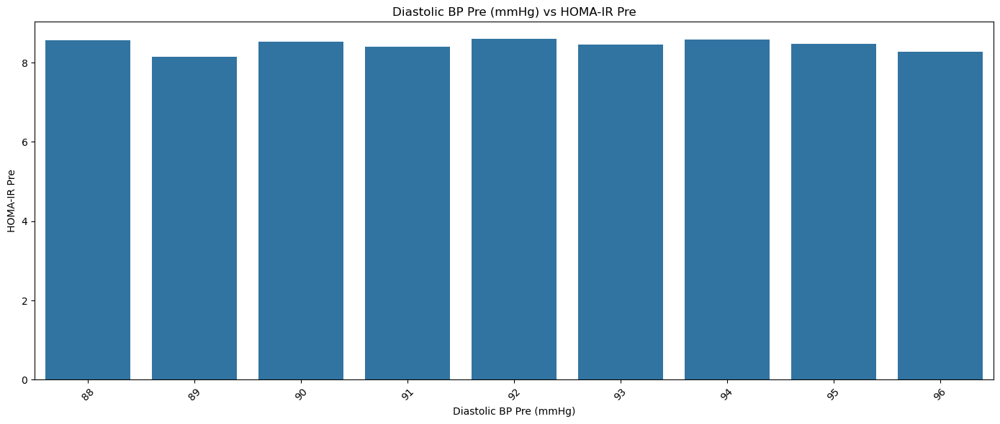

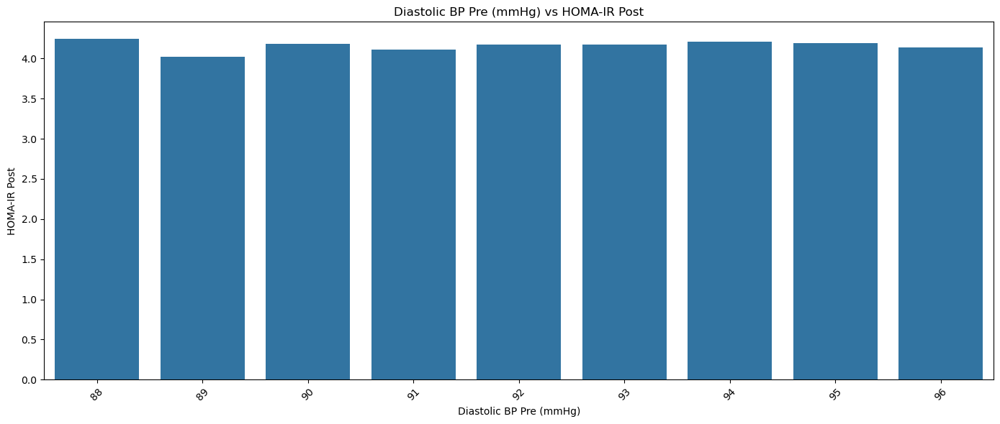

In [32]:
for cat in discrete:
    for con in continuous:
        plt.figure(figsize=(14,6))
        sns.barplot(x=df[cat], y=df[con], estimator='mean', errorbar='sd', ci = None)  
        plt.title(f'{cat} vs {con}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

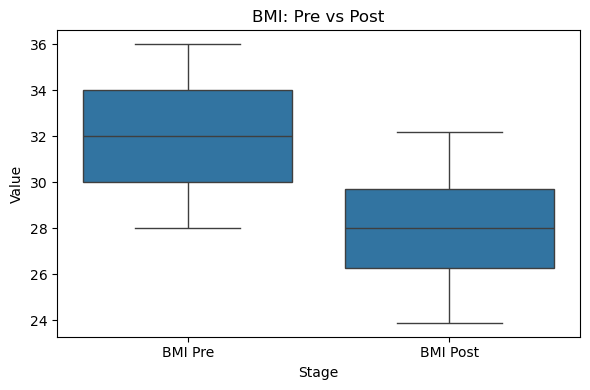

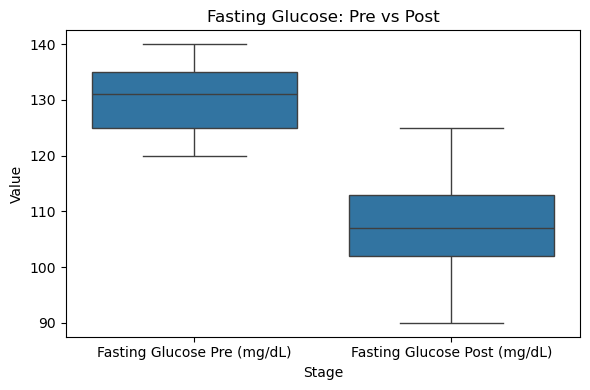

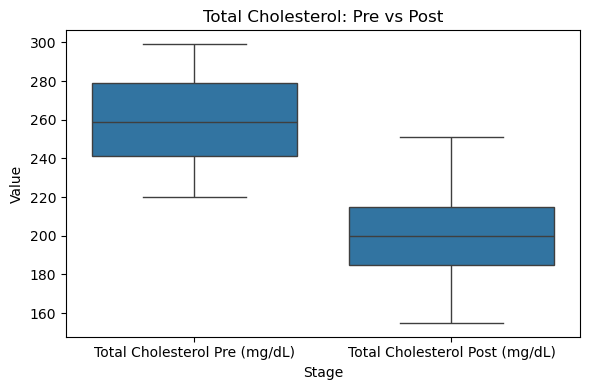

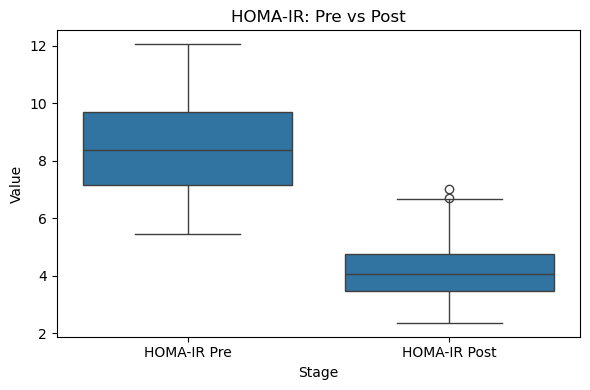

In [33]:
pairs = [
    ('BMI Pre', 'BMI Post'),
    ('Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)'),
    ('Total Cholesterol Pre (mg/dL)', 'Total Cholesterol Post (mg/dL)'),
    ('HOMA-IR Pre', 'HOMA-IR Post')
]

for pre, post in pairs:
    temp = df[[pre, post]].melt(var_name='Stage', value_name='Value')

    plt.figure(figsize=(6,4))
    sns.boxplot(data=temp, x='Stage', y='Value')
    plt.title(f'{pre.split(" Pre")[0]}: Pre vs Post')
    plt.tight_layout()
    plt.show()

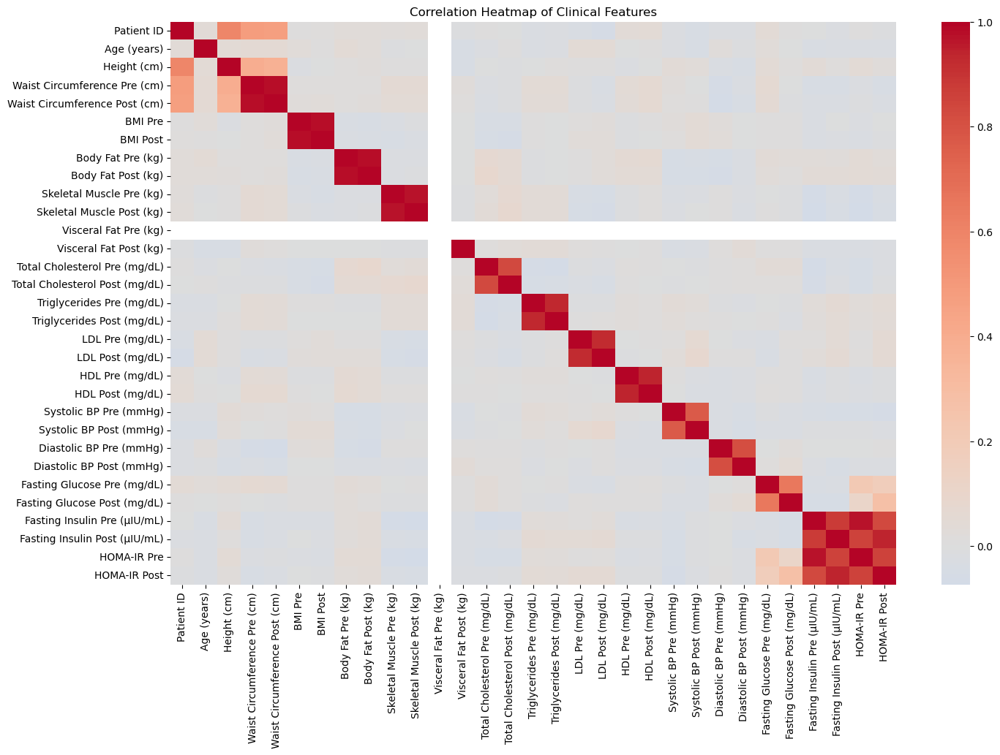

In [34]:
plt.figure(figsize=(16,10))
corr = df.select_dtypes(include='number').corr()

sns.heatmap(corr, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap of Clinical Features')
plt.show()

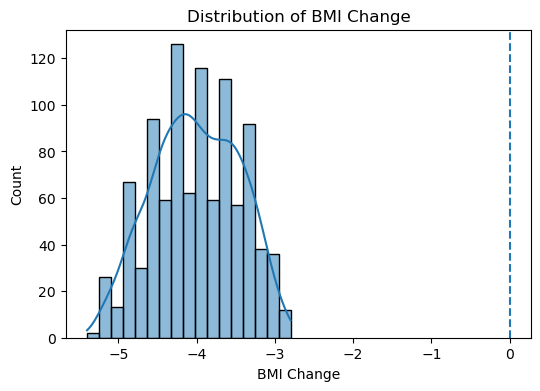

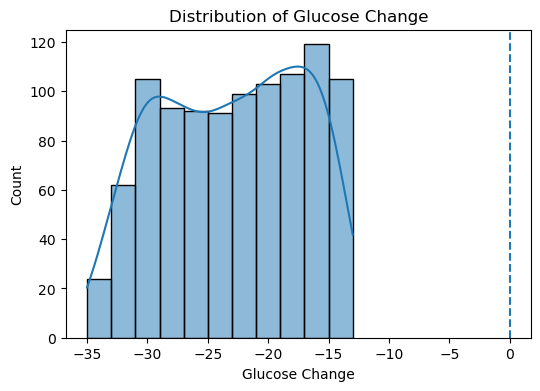

In [35]:
df['BMI Change'] = df['BMI Post'] - df['BMI Pre']
df['Glucose Change'] = df['Fasting Glucose Post (mg/dL)'] - df['Fasting Glucose Pre (mg/dL)']

changes = ['BMI Change', 'Glucose Change']

for col in changes:
    plt.figure(figsize=(6,4))
    sns.histplot(df[col], kde=True)
    plt.axvline(0, linestyle='--')
    plt.title(f'Distribution of {col}')
    plt.show()

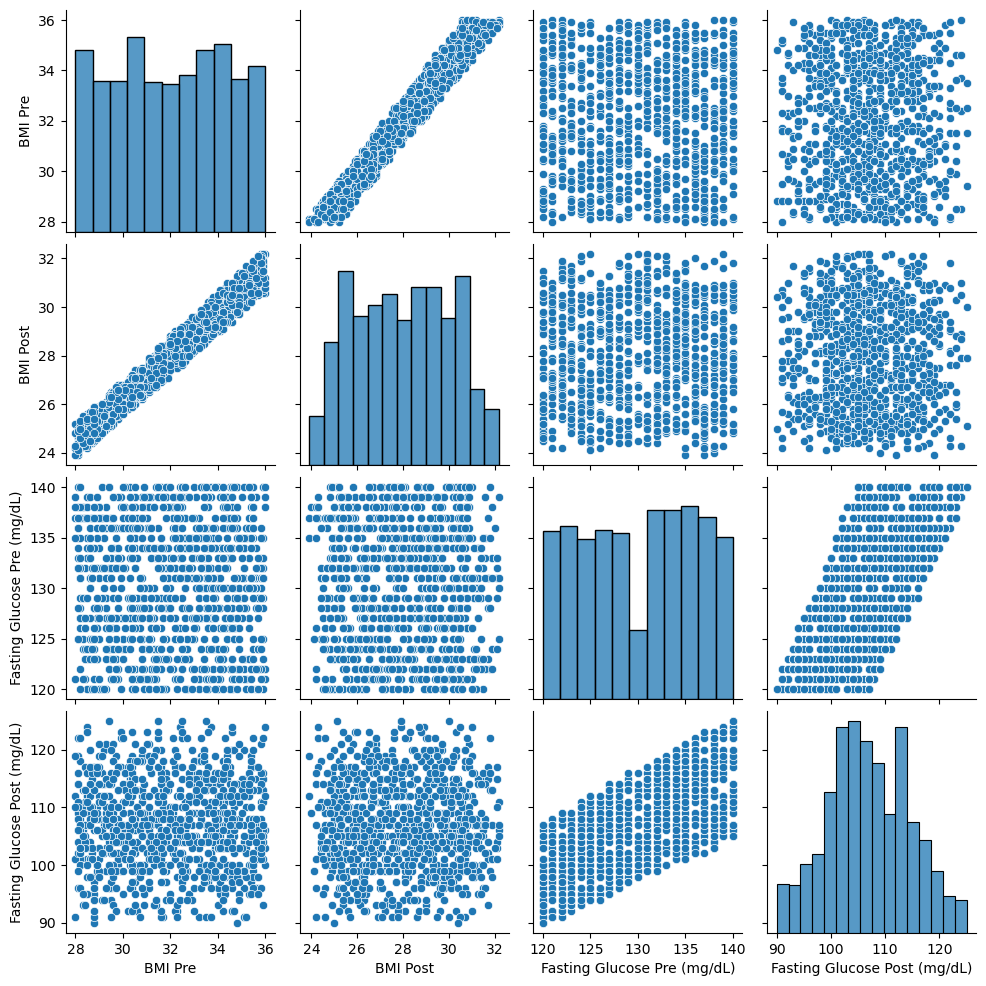

In [36]:
selected = ['BMI Pre', 'BMI Post', 'Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)']
sns.pairplot(df[selected])
plt.show()


In [37]:
df.groupby('Metabolic Syndrome Status (Post)').mean(numeric_only=True)

,Patient ID,Age (years),Height (cm),Waist Circumference Pre (cm),Waist Circumference Post (cm),BMI Pre,BMI Post,Body Fat Pre (kg),Body Fat Post (kg),Skeletal Muscle Pre (kg),...,Diastolic BP Pre (mmHg),Diastolic BP Post (mmHg),Fasting Glucose Pre (mg/dL),Fasting Glucose Post (mg/dL),Fasting Insulin Pre (µIU/mL),Fasting Insulin Post (µIU/mL),HOMA-IR Pre,HOMA-IR Post,BMI Change,Glucose Change
Metabolic Syndrome Status (Post),,,,,,,,,,,,,,,,,,,,,
Not in Remission,457.802083,31.500000,158.291667,114.479167,104.125000,31.961458,27.994792,34.038542,28.910417,23.404167,...,92.333333,83.333333,129.822917,106.989583,27.137500,16.600000,8.691250,4.373750,-3.966667,-22.833333
Remission,505.034292,32.626106,158.405973,117.846239,107.300885,32.003872,27.987279,33.522235,28.530973,23.532190,...,92.092920,83.336283,130.212389,107.040929,26.216814,15.668252,8.427478,4.139093,-4.016593,-23.171460


In [38]:
df.groupby(['Gender', 'Metabolic Syndrome Status (Post)']).mean(numeric_only=True)


Patient ID  Age (years)  Height (cm)  \
Gender Metabolic Syndrome Status (Post)                                         
Female Not in Remission                  223.490909    31.890909   156.581818   
       Remission                         264.877419    32.247312   156.479570   
Male   Not in Remission                  772.121951    30.975610   160.585366   
       Remission                         759.414579    33.027335   160.446469   

                                         Waist Circumference Pre (cm)  \
Gender Metabolic Syndrome Status (Post)                                 
Female Not in Remission                                    108.636364   
       Remission                                           111.516129   
Male   Not in Remission                                    122.317073   
       Remission                                           124.551253   

                                         Waist Circumference Post (cm)  \
Gender Metabolic Syndrome Status (Post)                                  
Female Not in Remission                                      98.672727   
       Remission                                            101.552688   
Male   Not in Remission                                     111.439024   
       Remission                                            113.389522   

                                           BMI Pre   BMI Post  \
Gender Metabolic Syndrome Status (Post)                         
Female Not in Remission                  31.985455  27.945455   
       Remission                         32.007742  27.976344   
Male   Not in Remission                  31.929268  28.060976   
       Remission                         31.999772  27.998861   

                                         Body Fat Pre (kg)  \
Gender Metabolic Syndrome Status (Post)                      
Female Not in Remission                          33.950909   
       Remission                                 33.209677   
Male   Not in Remission                          34.156098   
       Remission                                 33.853303   

                                         Body Fat Post (kg)  \
Gender Metabolic Syndrome Status (Post)                       
Female Not in Remission                           28.880000   
       Remission                                  28.228817   
Male   Not in Remission                           28.951220   
       Remission                                  28.851025   

                                         Skeletal Muscle Pre (kg)  ...  \
Gender Metabolic Syndrome Status (Post)                            ...   
Female Not in Remission                                 23.040000  ...   
       Remission                                        23.507527  ...   
Male   Not in Remission                                 23.892683  ...   
       Remission                                        23.558314  ...   

                                         Diastolic BP Pre (mmHg)  \
Gender Metabolic Syndrome Status (Post)                            
Female Not in Remission                                92.527273   
       Remission                                       92.174194   
Male   Not in Remission                                92.073171   
       Remission                                       92.006834   

                                         Diastolic BP Post (mmHg)  \
Gender Metabolic Syndrome Status (Post)                             
Female Not in Remission                                 83.581818   
       Remission                                        83.389247   
Male   Not in Remission                                 83.000000   
       Remission                                        83.280182   

                                         Fasting Glucose Pre (mg/dL)  \
Gender Metabolic Syndrome Status (Post)                                
Female Not in Remission                                   129.509091   
       Remission                          

In [39]:
pd.pivot_table(
    df,
    values=['BMI Pre', 'BMI Post'],
    index='Metabolic Syndrome Status (Post)',
    aggfunc='mean'
)

,BMI Post,BMI Pre
Metabolic Syndrome Status (Post),,
Not in Remission,27.994792,31.961458
Remission,27.987279,32.003872


In [40]:
pd.pivot_table(
    df,
    values='Patient ID',
    index='Gender',
    columns='Metabolic Syndrome Status (Post)',
    aggfunc='count'
)

Metabolic Syndrome Status (Post),Not in Remission,Remission
Gender,,
Female,55,465
Male,41,439


In [41]:
pd.pivot_table(
    df,
    values=['Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)'],
    index='Metabolic Syndrome Status (Post)',
    aggfunc=['mean', 'std']
)

mean  \
                                 Fasting Glucose Post (mg/dL)   
Metabolic Syndrome Status (Post)                                
Not in Remission                                   106.989583   
Remission                                          107.040929   

                                                              \
                                 Fasting Glucose Pre (mg/dL)   
Metabolic Syndrome Status (Post)                               
Not in Remission                                  129.822917   
Remission                                         130.212389   

                                                          std  \
                                 Fasting Glucose Post (mg/dL)   
Metabolic Syndrome Status (Post)                                
Not in Remission                                     8.363448   
Remission                                            7.527100   

                                                              
                                 Fasting Glucose Pre (mg/dL)  
Metabolic Syndrome Status (Post)                              
Not in Remission                                    6.314553  
Remission                                           5.985329

In [42]:
df['BMI Change'] = df['BMI Post'] - df['BMI Pre']

pd.pivot_table(
    df,
    values='BMI Change',
    index='Metabolic Syndrome Status (Post)',
    aggfunc=['mean', 'median']
)

,mean,median
,BMI Change,BMI Change
Metabolic Syndrome Status (Post),,
Not in Remission,-3.966667,-3.95
Remission,-4.016593,-4.00


In [43]:
df.groupby('Metabolic Syndrome Status (Post)')['Diastolic BP Pre (mmHg)'].value_counts()

Metabolic Syndrome Status (Post)  Diastolic BP Pre (mmHg)
Not in Remission                  89                          14
                                  94                          14
                                  96                          13
                                  95                          12
                                  92                          11
                                  91                          10
                                  90                           8
                                  93                           8
                                  88                           6
Remission                         92                         117
                                  95                         108
                                  90                         106
                                  93                         102
                                  96                         102
                                

In [44]:
summary = df.groupby('Metabolic Syndrome Status (Post)')[[
    'BMI Pre', 'BMI Post',
    'Fasting Glucose Pre (mg/dL)', 'Fasting Glucose Post (mg/dL)',
    'HOMA-IR Pre', 'HOMA-IR Post'
]].agg(['mean', 'std'])

summary

BMI Pre             BMI Post            \
                                       mean       std       mean       std   
Metabolic Syndrome Status (Post)                                             
Not in Remission                  31.961458  2.346660  27.994792  2.156721   
Remission                         32.003872  2.320551  27.987279  2.076026   

                                 Fasting Glucose Pre (mg/dL)            \
                                                        mean       std   
Metabolic Syndrome Status (Post)                                         
Not in Remission                                  129.822917  6.314553   
Remission                                         130.212389  5.985329   

                                 Fasting Glucose Post (mg/dL)            \
                                                         mean       std   
Metabolic Syndrome Status (Post)                                          
Not in Remission                                   106.989583  8.363448   
Remission                                          107.040929  7.527100   

                                 HOMA-IR Pre           HOMA-IR Post            
                                        mean       std         mean       std  
Metabolic Syndrome Status (Post)                                               
Not in Remission                    8.691250  1.650992     4.373750  0.975744  
Remission                           8.427478  1.577427     4.139093  0.909609

In [45]:
table1 = pd.pivot_table(
    df,
    values=['Age (years)', 'BMI Pre', 'Fasting Glucose Pre (mg/dL)', 'HOMA-IR Pre'],
    index='Metabolic Syndrome Status (Post)',
    aggfunc=['mean', 'std']
)

table1

mean             \
                                 Age (years)    BMI Pre   
Metabolic Syndrome Status (Post)                          
Not in Remission                   31.500000  31.961458   
Remission                          32.626106  32.003872   

                                                                          \
                                 Fasting Glucose Pre (mg/dL) HOMA-IR Pre   
Metabolic Syndrome Status (Post)                                           
Not in Remission                                  129.822917    8.691250   
Remission                                         130.212389    8.427478   

                                         std            \
                                 Age (years)   BMI Pre   
Metabolic Syndrome Status (Post)                         
Not in Remission                    6.911470  2.346660   
Remission                           7.604395  2.320551   

                                                                          
                                 Fasting Glucose Pre (mg/dL) HOMA-IR Pre  
Metabolic Syndrome Status (Post)                                          
Not in Remission                                    6.314553    1.650992  
Remission                                           5.985329    1.577427

In [46]:
target = 'Metabolic Syndrome Status (Post)'

features = [
    'Gender',
    'Age (years)',
    'Height (cm)',
    'Waist Circumference Pre (cm)',
    'BMI Pre',
    'Body Fat Pre (kg)',
    'Skeletal Muscle Pre (kg)',
    'Visceral Fat Pre (kg)',
    'Total Cholesterol Pre (mg/dL)',
    'Triglycerides Pre (mg/dL)',
    'LDL Pre (mg/dL)',
    'HDL Pre (mg/dL)',
    'Systolic BP Pre (mmHg)',
    'Diastolic BP Pre (mmHg)',
    'Fasting Glucose Pre (mg/dL)',
    'Fasting Insulin Pre (µIU/mL)',
    'HOMA-IR Pre'
]

df_ml = df[features + [target]].copy()

In [47]:
df_ml

,Gender,Age (years),Height (cm),Waist Circumference Pre (cm),BMI Pre,Body Fat Pre (kg),Skeletal Muscle Pre (kg),Visceral Fat Pre (kg),Total Cholesterol Pre (mg/dL),Triglycerides Pre (mg/dL),LDL Pre (mg/dL),HDL Pre (mg/dL),Systolic BP Pre (mmHg),Diastolic BP Pre (mmHg),Fasting Glucose Pre (mg/dL),Fasting Insulin Pre (µIU/mL),HOMA-IR Pre,Metabolic Syndrome Status (Post)
0,Female,29,156,113,32.3,27.2,19.6,20,240,304,153,30,133,92,125,29.0,8.95,Remission
1,Female,35,156,104,32.7,40.8,20.0,20,246,303,167,38,136,88,139,24.8,8.51,Remission
2,Female,44,159,97,28.7,32.1,22.9,20,299,289,144,34,139,92,131,27.8,8.99,Remission
3,Female,24,157,107,35.7,32.6,24.8,20,261,294,190,39,136,93,127,20.0,6.27,Remission
4,Female,36,158,124,34.7,35.0,28.0,20,253,286,207,26,133,92,130,21.0,6.74,Remission
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Male,21,161,140,29.2,34.5,27.3,20,233,186,145,37,135,95,132,20.3,6.62,Remission
996,Male,34,157,112,33.5,25.3,24.6,20,242,292,219,26,137,90,135,32.8,10.93,Remission
997,Male,43,158,140,34.6,41.6,20.8,20,223,264,173,27,132,92,122,27.4,8.25,Remission
998,Male,36,160,125,34.2,34.7,24.3,20,270,235,195,29,130,90,130,22.5,7.22,Remission


In [48]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import torch
import torch.nn as nn
import torch.optim as optim

target_col = 'Metabolic Syndrome Status (Post)'

df_ml[target_col] = df_ml[target_col].astype(str).str.strip().str.lower()

status_map = {
    'remission': 0,
    'not in remission': 1,
    'not_in_remission': 1,
    'active': 1,
    'present': 1
}

y = df_ml[target_col].map(status_map)

if y.isna().any():
    print("Unmapped values found:")
    print(df_ml[target_col][y.isna()].value_counts())
    raise ValueError("Fix target labels before continuing")

y = y.astype(int)

features = [
    'Age (years)',
    'Height (cm)',
    'Waist Circumference Pre (cm)',
    'BMI Pre',
    'Body Fat Pre (kg)',
    'Skeletal Muscle Pre (kg)',
    'Total Cholesterol Pre (mg/dL)',
    'Triglycerides Pre (mg/dL)',
    'LDL Pre (mg/dL)',
    'HDL Pre (mg/dL)',
    'Systolic BP Pre (mmHg)',
    'Diastolic BP Pre (mmHg)',
    'Fasting Glucose Pre (mg/dL)',
    'Fasting Insulin Pre (µIU/mL)',
    'HOMA-IR Pre'
]

X = df_ml[features].copy()

constant_cols = [col for col in X.columns if X[col].nunique() <= 1]
if constant_cols:
    X = X.drop(columns=constant_cols)

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

minority_mask = y_train == 1
X_min = X_train[minority_mask]
y_min = y_train[minority_mask]

ratio = len(X_train[~minority_mask]) // len(X_min) if len(X_min) > 0 else 0

if ratio > 1:
    X_min_os = pd.concat([X_min] * ratio, ignore_index=True)
    y_min_os = pd.concat([y_min] * ratio, ignore_index=True)
    X_train_bal = pd.concat([X_train, X_min_os], ignore_index=True)
    y_train_bal = pd.concat([y_train, y_min_os], ignore_index=True)
else:
    X_train_bal = X_train
    y_train_bal = y_train

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_bal)
X_test_scaled  = scaler.transform(X_test)

lr_model = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
lr_model.fit(X_train_scaled, y_train_bal)
y_pred_lr = lr_model.predict(X_test_scaled)

print("Logistic Regression")
print(confusion_matrix(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr, target_names=['Remission', 'Not in Remission'], digits=4))

dt_model = DecisionTreeClassifier(class_weight='balanced', random_state=42)
dt_model.fit(X_train_scaled, y_train_bal)
y_pred_dt = dt_model.predict(X_test_scaled)

print("Decision Tree")
print(confusion_matrix(y_test, y_pred_dt))
print(classification_report(y_test, y_pred_dt, target_names=['Remission', 'Not in Remission'], digits=4))

rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)
rf_model.fit(X_train_scaled, y_train_bal)
y_pred_rf = rf_model.predict(X_test_scaled)

print("Random Forest")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf, target_names=['Remission', 'Not in Remission'], digits=4))

class SimpleMLP(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.net(x)

X_tr_t  = torch.tensor(X_train_scaled,  dtype=torch.float32)
y_tr_t  = torch.tensor(y_train_bal.values,  dtype=torch.float32).unsqueeze(1)
X_te_t  = torch.tensor(X_test_scaled,   dtype=torch.float32)

model = SimpleMLP(input_dim=X_tr_t.shape[1])
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)

epochs = 300
batch_size = 128

for epoch in range(epochs):
    model.train()
    perm = torch.randperm(len(X_tr_t))
    total_loss = 0
    
    for i in range(0, len(X_tr_t), batch_size):
        idx = perm[i:i+batch_size]
        xb = X_tr_t[idx]
        yb = y_tr_t[idx]
        
        optimizer.zero_grad()
        out = model(xb)
        loss = criterion(out, yb)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item() * len(xb)
    
    if (epoch + 1) % 50 == 0:
        print(f"Epoch {epoch+1}/{epochs}  loss: {total_loss / len(X_tr_t):.5f}")

model.eval()
with torch.no_grad():
    y_prob_mlp = model(X_te_t).squeeze().numpy()
    y_pred_mlp = (y_prob_mlp >= 0.5).astype(int)

print("MLP Classifier")
print(confusion_matrix(y_test, y_pred_mlp))
print(classification_report(y_test, y_pred_mlp, target_names=['Remission', 'Not in Remission'], digits=4))

ModuleNotFoundError: No module named 'torch'

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import torch
import torch.nn as nn
import torch.optim as optim

target_col = 'Metabolic Syndrome Status (Post)'

df_ml[target_col] = df_ml[target_col].astype(str).str.strip().str.lower()

status_map = {
    'remission': 0,
    'not in remission': 1,
    'not_in_remission': 1,
    'active': 1,
    'present': 1
}

y = df_ml[target_col].map(status_map)

if y.isna().any():
    print("Unmapped values found:")
    print(df_ml[target_col][y.isna()].value_counts())
    raise ValueError("Fix target labels before continuing")

y = y.astype(int)

features = [
    'Age (years)',
    'Height (cm)',
    'Waist Circumference Pre (cm)',
    'BMI Pre',
    'Body Fat Pre (kg)',
    'Skeletal Muscle Pre (kg)',
    'Total Cholesterol Pre (mg/dL)',
    'Triglycerides Pre (mg/dL)',
    'LDL Pre (mg/dL)',
    'HDL Pre (mg/dL)',
    'Systolic BP Pre (mmHg)',
    'Diastolic BP Pre (mmHg)',
    'Fasting Glucose Pre (mg/dL)',
    'Fasting Insulin Pre (µIU/mL)',
    'HOMA-IR Pre'
]

X = df_ml[features].copy()

constant_cols = [col for col in X.columns if X[col].nunique() <= 1]
if constant_cols:
    X = X.drop(columns=constant_cols)

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

minority_mask = y_train == 1
X_min = X_train[minority_mask]
y_min = y_train[minority_mask]

ratio = len(X_train[~minority_mask]) // len(X_min) if len(X_min) > 0 else 0

if ratio > 1:
    X_min_os = pd.concat([X_min] * ratio, ignore_index=True)
    y_min_os = pd.concat([y_min] * ratio, ignore_index=True)
    X_train_bal = pd.concat([X_train, X_min_os], ignore_index=True)
    y_train_bal = pd.concat([y_train, y_min_os], ignore_index=True)
else:
    X_train_bal = X_train
    y_train_bal = y_train

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_bal)
X_test_scaled  = scaler.transform(X_test)

lr_model = LogisticRegression(class_weight='balanced', max_iter=1000, random_state=42)
lr_model.fit(X_train_scaled, y_train_bal)
y_pred_lr = lr_model.predict(X_test_scaled)

print("Logistic Regression")
print(confusion_matrix(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr, target_names=['Remission', 'Not in Remission'], digits=4))

dt_model = DecisionTreeClassifier(class_weight='balanced', random_state=42)
dt_model.fit(X_train_scaled, y_train_bal)
y_pred_dt = dt_model.predict(X_test_scaled)

print("Decision Tree")
print(confusion_matrix(y_test, y_pred_dt))
print(classification_report(y_test, y_pred_dt, target_names=['Remission', 'Not in Remission'], digits=4))

rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)
rf_model.fit(X_train_scaled, y_train_bal)
y_pred_rf = rf_model.predict(X_test_scaled)

print("Random Forest")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf, target_names=['Remission', 'Not in Remission'], digits=4))

class SimpleMLP(nn.Module):
    def __init__(self, input_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        return self.net(x)

X_tr_t  = torch.tensor(X_train_scaled,  dtype=torch.float32)
y_tr_t  = torch.tensor(y_train_bal.values,  dtype=torch.float32).unsqueeze(1)
X_te_t  = torch.tensor(X_test_scaled,   dtype=torch.float32)

model = SimpleMLP(input_dim=X_tr_t.shape[1])
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)

epochs = 300
batch_size = 128

for epoch in range(epochs):
    model.train()
    perm = torch.randperm(len(X_tr_t))
    total_loss = 0
    
    for i in range(0, len(X_tr_t), batch_size):
        idx = perm[i:i+batch_size]
        xb = X_tr_t[idx]
        yb = y_tr_t[idx]
        
        optimizer.zero_grad()
        out = model(xb)
        loss = criterion(out, yb)
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item() * len(xb)
    
    if (epoch + 1) % 50 == 0:
        print(f"Epoch {epoch+1}/{epochs}  loss: {total_loss / len(X_tr_t):.5f}")

model.eval()
with torch.no_grad():
    y_prob_mlp = model(X_te_t).squeeze().numpy()
    y_pred_mlp = (y_prob_mlp >= 0.5).astype(int)

print("MLP Classifier")
print(confusion_matrix(y_test, y_pred_mlp))
print(classification_report(y_test, y_pred_mlp, target_names=['Remission', 'Not in Remission'], digits=4))

class TabularTransformer(nn.Module):
    def __init__(self, input_dim, embed_dim=32, num_heads=2, num_layers=2, dropout=0.1):
        super().__init__()
        self.embedding = nn.Linear(input_dim, embed_dim)
        encoder_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=num_heads, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_layers)
        self.fc = nn.Linear(embed_dim, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.embedding(x)
        x = x.unsqueeze(1)
        x = self.transformer_encoder(x)
        x = x.mean(dim=1)
        x = self.sigmoid(self.fc(x))
        return x

transformer_model = TabularTransformer(input_dim=X_tr_t.shape[1])
optimizer_t = optim.Adam(transformer_model.parameters(), lr=0.001, weight_decay=1e-4)

for epoch in range(epochs):
    transformer_model.train()
    perm = torch.randperm(len(X_tr_t))
    total_loss = 0
    
    for i in range(0, len(X_tr_t), batch_size):
        idx = perm[i:i+batch_size]
        xb = X_tr_t[idx]
        yb = y_tr_t[idx]
        
        optimizer_t.zero_grad()
        out = transformer_model(xb)
        loss = criterion(out, yb)
        loss.backward()
        optimizer_t.step()
        
        total_loss += loss.item() * len(xb)
    
    if (epoch + 1) % 50 == 0:
        print(f"Transformer Epoch {epoch+1}/{epochs}  loss: {total_loss / len(X_tr_t):.5f}")

transformer_model.eval()
with torch.no_grad():
    y_prob_t = transformer_model(X_te_t).squeeze().numpy()
    y_pred_t = (y_prob_t >= 0.5).astype(int)

print("Tabular Transformer")
print(confusion_matrix(y_test, y_pred_t))
print(classification_report(y_test, y_pred_t, target_names=['Remission', 'Not in Remission'], digits=4))

Logistic Regression
[[109  72]
 [ 11   8]]
                  precision    recall  f1-score   support

       Remission     0.9083    0.6022    0.7243       181
Not in Remission     0.1000    0.4211    0.1616        19

        accuracy                         0.5850       200
       macro avg     0.5042    0.5116    0.4429       200
    weighted avg     0.8315    0.5850    0.6708       200

Decision Tree
[[170  11]
 [ 16   3]]
                  precision    recall  f1-score   support

       Remission     0.9140    0.9392    0.9264       181
Not in Remission     0.2143    0.1579    0.1818        19

        accuracy                         0.8650       200
       macro avg     0.5641    0.5486    0.5541       200
    weighted avg     0.8475    0.8650    0.8557       200

Random Forest
[[181   0]
 [ 19   0]]
                  precision    recall  f1-score   support

       Remission     0.9050    1.0000    0.9501       181
Not in Remission     0.0000    0.0000    0.0000        19

     